# Faraday Dreams Real Data Example assuming postive and negative $\lambda^2$ for solution

Then recovery is performed using Faraday Dreams + Optimus Primal on real data.

In [1]:
import sys
sys.path.insert(0,'..')
#put path to optimusprimal git repo
sys.path.insert(0,'../../Optimus-Primal')
import optimusprimal.prox_operators as prox_operators
import optimusprimal.linear_operators as linear_operators
import optimusprimal.primal_dual as primal_dual
import faradaydreams.measurement_operator as measurement_operator
import faradaydreams.models as models
import faradaydreams.plot_spectrum as plot_spectrum
import faradaydreams.convex_solvers as solvers
import numpy as np
import matplotlib.pyplot as plt
from astropy.table import Table

Reads the data and sets up the observation

In [2]:
#data from http://vizier.u-strasbg.fr/viz-bin/VizieR-3?-source=J/ApJ/825/59/table6
table_data = Table.read("../data/anderson_rms.vot")
sources = np.array(np.unique(table_data['ID']))
def get_data(source, table_data, sigma_factor):
    data = table_data[table_data['ID']==source]
    y =  np.array(data['Q'] + 1j * data['U'])
    stokes_I = np.array(data['I'])
    print(len(stokes_I))
    weights_q = np.array(data['e_Q'])
    weights_u = np.array(data['e_U'])
    sigma = np.std(np.abs(weights_q + 1j * weights_u)) 
    sigma = sig_factor * sigma
    c = 2.92 * 10**8 #speed of light m/s
    m_size = len(y) #numbr of channels
    freq0 = np.real(data["nu"]) * 10**9  # frequency coverage
    dfreq = np.abs(20 * 10**6) # channel width
    lambda2 = (c/freq0)**2 #wavelength^2 coverage
    lambda1 = np.sqrt(lambda2) # wavelength coverage
    dlambda2 = (c/(freq0 - dfreq/2.))**2 - (c/(freq0 + dfreq/2.))**2 #channel width in wavelength squared.
    phi_max, phi_min, dphi = measurement_operator.phi_parameters(lambda2, dlambda2) #sensitivity estiamtes given coverage
    phi_max = 2000
    phi_min = -2000
    dphi = 40
    phi = np.arange(phi_min,phi_max, dphi/2., dtype=float) # range in rad/m^2 to do reconstruction of signal
    weights = np.std(np.abs(weights_q + 1j * weights_u))/np.abs(weights_q + 1j * weights_u) #choosing flat noise
    return y, weights, phi, lambda2, dlambda2, sigma, stokes_I

In [3]:
def plot_results(solution_right, solution_wrong, y, weights, phi, lambda2, dlambda2, sigma, rm_max, rm_min, stokes_I):
    m_op_right = measurement_operator.faraday_operator(lambda2, phi, weights, dlambda2)
    m_op_wrong = measurement_operator.faraday_operator(lambda2, phi, weights)
    # measurement operator without channel averaging
    lambda2_high_res = np.linspace(-np.max(lambda2), np.max(lambda2), 2048)
    m_op_no_averaging = measurement_operator.faraday_operator(lambda2_high_res, phi, lambda2_high_res * 0 + 1)
    fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(10, 10), dpi=80)
    ax[0].errorbar(lambda2, np.real(y), yerr=1/weights *sigma/np.sqrt(2), fmt='',linestyle='')
    ax[0].errorbar(lambda2, np.imag(y), yerr=1/weights * sigma/np.sqrt(2), fmt='',linestyle='')
    ax[0].errorbar(lambda2, np.abs(y), yerr=1/weights * sigma, fmt='',linestyle='')
    #ax[0].set_ylim([-np.max(np.abs(y)),np.max(np.abs(y))])
    ax[0].set_xlim([0,0.25**2])
    ax[0].set_xlabel(r"$\lambda^2$ (m^2)")
    ax[0].set_ylabel(r"(Jy)")
    ax[0].legend(["Observed (Real)", "Observed (Imag)", "Observed ||"])
    ax[1].plot(phi, np.abs(m_op_right.adj_op(y  * weights)) * 1./np.sum(weights**2)/sigma)
    ax[2].plot(phi, np.abs(m_op_wrong.adj_op((y * 0. + weights)/np.sum(np.abs(weights)**2))))
    ax[1].legend(["Dirty | |"])
    ax[1].set_xlabel(r"$\phi$ (rad/m$^2$)")
    ax[1].set_ylabel(r"(Jy)")
    ax[2].legend(["PSF | |"])
    ax[2].set_xlabel(r"$\phi$ (rad/m$^2$)")
    ax[2].set_ylabel(r"(Jy)")
    y_right = m_op_right.dir_op(solution_right) 
    y_wrong = m_op_wrong.dir_op(solution_wrong) 
    y_model_dirac = m_op_no_averaging.dir_op(solution_right)
    y_model_wav = m_op_no_averaging.dir_op(solution_wrong) 
    fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(20, 20), dpi=80)
    ax = np.ravel(ax)
    ax[0].plot(lambda2_high_res, np.real(y_model_dirac))
    ax[0].plot(lambda2_high_res, np.imag(y_model_dirac))
    ax[0].plot(lambda2_high_res, np.real(y_model_wav))
    ax[0].plot(lambda2_high_res, np.imag(y_model_wav))
    ax[0].errorbar(lambda2, np.real(y), yerr=1/weights * sigma/np.sqrt(2), fmt='',linestyle='')
    ax[0].errorbar(lambda2, np.imag(y), yerr=1/weights * sigma/np.sqrt(2), fmt='',linestyle='')
    ax[0].set_xlim([-0.23**2., 0.23**2])
    ax[0].set_xlabel(r"$\lambda^2$ (m$^2$)")
    ax[0].set_ylabel(r"(Jy)")
    ax[0].legend(["Q Dirac", "U Dirac", "Q Wavelet", "U Wavelet",  "Q Data", "U Data"])
    ax[1].plot(lambda2_high_res, np.abs(y_model_dirac))
    ax[1].plot(lambda2_high_res, np.abs(y_model_wav))
    ax[1].errorbar(lambda2, np.abs(y), yerr=1/weights * sigma, fmt='',linestyle='')
    ax[1].set_xlim([-0.23**2., 0.23**2])
    ax[1].set_xlabel(r"$\lambda^2$ (m$^2$)")
    ax[1].set_ylabel(r"(Jy)")
    ax[1].legend(["|P| Dirac", "|P| Wavelet", "|P| Data"])
    ax[2].plot(lambda2_high_res[lambda2_high_res >=0], np.angle(y_model_dirac[lambda2_high_res >=0]))
    ax[2].plot(lambda2_high_res[lambda2_high_res >=0], np.angle(y_model_wav[lambda2_high_res >=0]))
    ax[2].errorbar(lambda2, np.angle(y), yerr=0.1 * np.pi, fmt='',linestyle='')
    ax[2].set_xlim([-0.23**2, 0.23**2])
    ax[2].set_xlabel(r"$\lambda^2$ (m$^2$)")
    ax[2].set_ylabel(r"(rad)")
    ax[2].legend(["PA Dirac Measurements", "PA Wavelet Measurements", "PA Measurements",])
    ax[3].plot(phi, np.abs(solution_right))
    ax[3].plot(phi, np.real(solution_right))
    ax[3].plot(phi, np.imag(solution_right))
    ax[3].legend([ "|P| Dirac", "Q Dirac", "U Dirac"])
    ax[3].set_xlabel(r"$\phi$ (rad/m$^2$)")
    ax[3].set_ylabel(r"(Jy/pixel)")
    ax[3].set_xlim([rm_min, rm_max])
    ax[4].plot(phi, np.abs(solution_wrong))
    ax[4].plot(phi, np.real(solution_wrong))
    ax[4].plot(phi, np.imag(solution_wrong))
    ax[4].legend([ "|P| Wavelet", "Q Wavelet", "U Wavelet"])
    ax[4].set_xlabel(r"$\phi$ (rad/m$^2$)")
    ax[4].set_ylabel(r"(rad)")
    ax[4].set_xlim([rm_min, rm_max])
    ax[5].plot(phi, np.abs(m_op_right.adj_op(y_right)) * 1./np.sum(weights**2))
    ax[5].plot(phi, np.abs(m_op_right.adj_op(y_wrong)) * 1./np.sum(weights**2))
    ax[5].plot(phi, np.abs(m_op_right.adj_op(y  * weights)) * 1./np.sum(weights**2))
    ax[5].plot(phi, np.abs(m_op_right.adj_op((y* weights  - y_right))) * 1./np.sum(weights**2))
    ax[5].plot(phi, np.abs(m_op_right.adj_op((y * weights  - y_wrong))) * 1./np.sum(weights**2))
    ax[5].set_xlabel(r"$\phi$ (rad/m$^2$)")
    ax[5].set_ylabel(r"(Jy/beam)")
    ax[5].legend(["|P| Dirac Dirty", "|P| Wavelet Dirty", "|P| Dirty", "|P| Dirac Residual", "|P| Wavelet Residual"])

In [4]:
def test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2):
    y, weights, phi, lambda2, dlambda2, sigma, stokes_I = get_data(source, table_data, sig_factor)
    # measurement operator with channel averaging
    m_op_right = measurement_operator.faraday_operator(lambda2, phi, weights)
    m_op_wrong = measurement_operator.faraday_operator(lambda2, phi, weights)
    options = options={'tol': 1e-5, 'iter': 50000, 'update_iter': 1000, 'record_iters': False, 'real': False, 'positivity': False, 'project_positive_lambda2': False}
    #get solution of algo and run
    nu, sol = linear_operators.power_method(m_op_right, phi* 0 + 1, 1e-4)#estimate stepsize for algo (largest eigen value of measurement matrix)
    solution_right, diag_right = solvers.solver(solvers.algorithm.l1_constrained, weights * y, sigma, m_op_right, ['dirac'], levels, nu, beta1, options)
    #get solution of algo and run
    nu, sol = linear_operators.power_method(m_op_wrong, phi* 0 + 1, 1e-4)#estimate stepsize for algo (largest eigen value of measurement matrix)
    solution_wrong, diag_wrong = solvers.solver(solvers.algorithm.l1_constrained, weights * y, sigma, m_op_wrong, wav, levels, nu, beta2, options)
    plot_results(solution_right, solution_wrong, y, weights, phi, lambda2, dlambda2, sigma, rm_max, rm_min, stokes_I)

In [5]:
print(sources)
print(len(sources))

[b'0515-674' b'1315-46' b'cena_c1093' b'cena_c1152' b'cena_c1435'
 b'cena_c1466' b'cena_c1573' b'cena_c1636' b'cena_c1640' b'cena_c1748'
 b'cena_c1764' b'cena_c1827' b'cena_c1832' b'cena_c1972' b'cena_s1014'
 b'cena_s1031' b'cena_s1290' b'cena_s1349' b'cena_s1382' b'cena_s1437'
 b'cena_s1443' b'cena_s1568' b'cena_s1605' b'cena_s1681' b'cena_s1803'
 b'lmc_c01' b'lmc_c02' b'lmc_c03' b'lmc_c04' b'lmc_c06' b'lmc_c07'
 b'lmc_c15' b'lmc_c16' b'lmc_s11' b'lmc_s13' b'lmc_s14']
36


b'0515-674'
174
2020-08-09 15:05:45,283 - Faraday Dreams - INFO - φ resolution 19.059294627146272 rad/m^2.
2020-08-09 15:05:45,283 - Faraday Dreams - INFO - φ max range is 285349.0119092751 rad/m^2.
2020-08-09 15:05:45,284 - Faraday Dreams - INFO - φ min range is 607.3368668121005 rad/m^2.
2020-08-09 15:05:45,315 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:05:45,320 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:05:45,322 - Optimus Primal - INFO - [Power Method] Converged with iter = 6, tol = 4.518829637486645e-05
2020-08-09 15:05:45,322 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:05:45,323 - Faraday Dreams - INFO - Using an estimated noise level of 6.342221604427323e-05 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:05:45,324 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2020-08-09 15:05:45,326 - Optimus Primal - INFO - Running Forward Backward Primal Dual


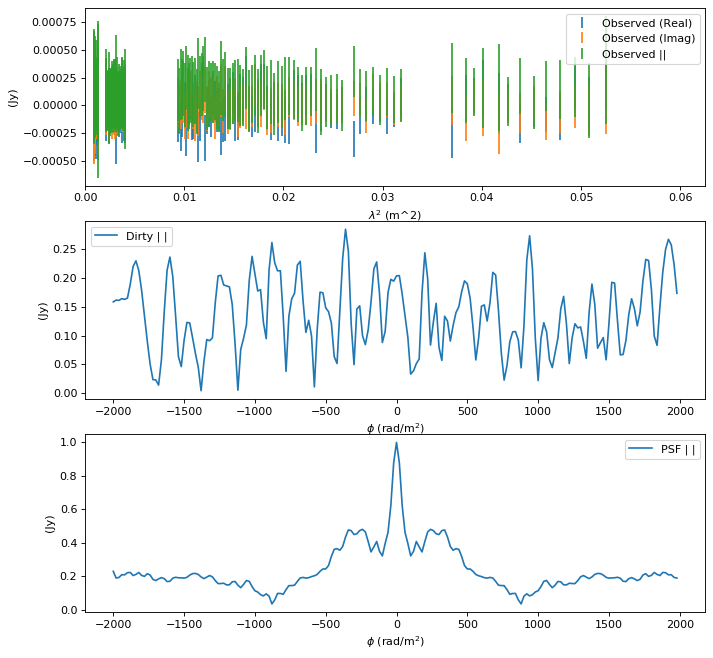

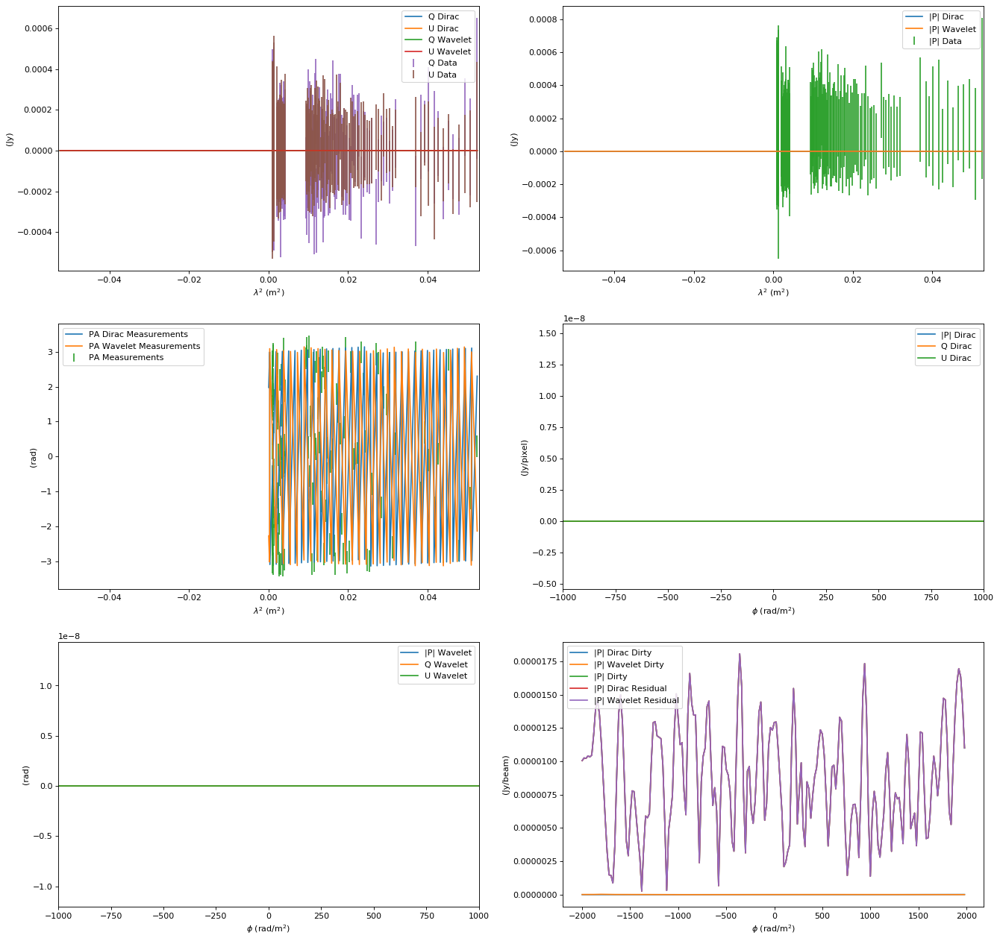

In [6]:
source = sources[0]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-4
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'1315-46'
153
2020-08-09 15:05:53,786 - Faraday Dreams - INFO - φ resolution 22.839070130711672 rad/m^2.
2020-08-09 15:05:53,787 - Faraday Dreams - INFO - φ max range is 262294.9429406143 rad/m^2.
2020-08-09 15:05:53,787 - Faraday Dreams - INFO - φ min range is 796.701954265227 rad/m^2.
2020-08-09 15:05:53,813 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:05:53,815 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:05:53,816 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2020-08-09 15:05:53,818 - Optimus Primal - INFO - [Power Method] Converged with iter = 19, tol = 9.282331792348583e-05
2020-08-09 15:05:53,818 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:05:53,819 - Faraday Dreams - INFO - Using an estimated noise level of 9.14860938792117e-05 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:05:53,820 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
202

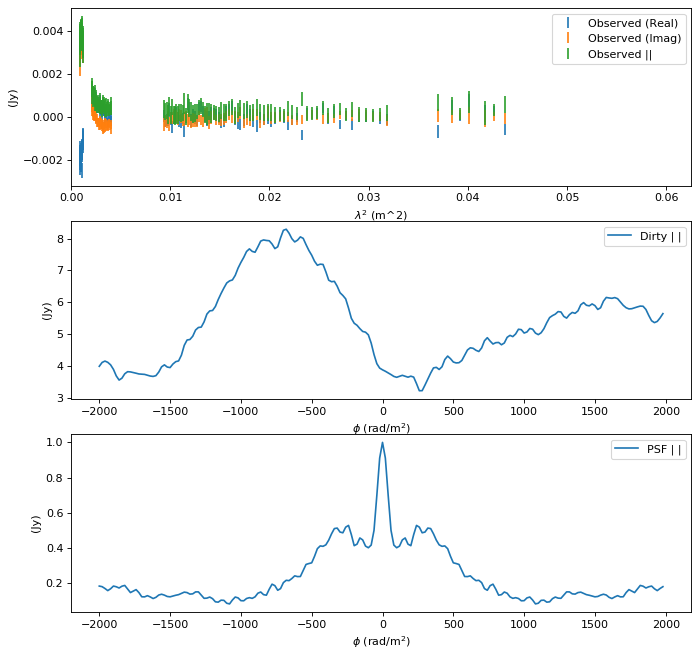

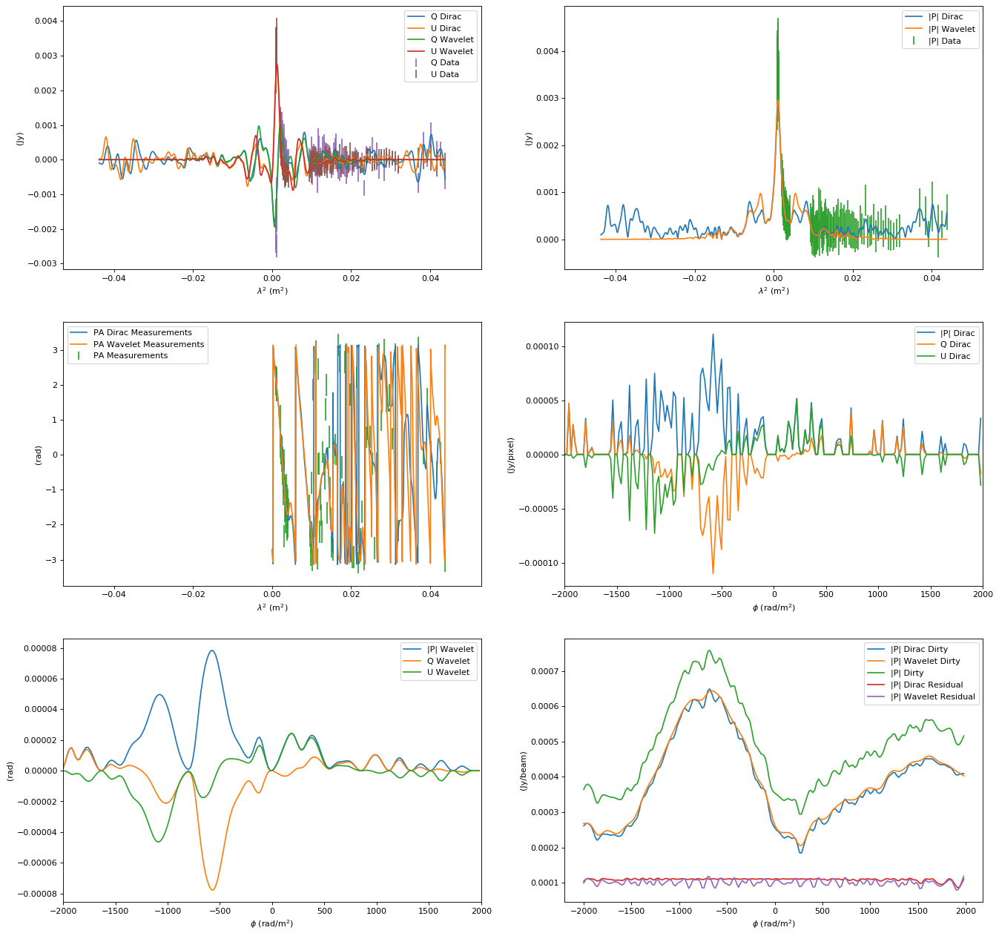

In [7]:
source = sources[1]
print(source)
wav = ['db4', 'db6', 'db8']
levels = 1
sig_factor = 1
rm_max = 2000
rm_min = -2000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_c1093'
139
2020-08-09 15:06:31,315 - Faraday Dreams - INFO - φ resolution 19.82060893267968 rad/m^2.
2020-08-09 15:06:31,318 - Faraday Dreams - INFO - φ max range is 279275.4619333624 rad/m^2.
2020-08-09 15:06:31,320 - Faraday Dreams - INFO - φ min range is 644.0905860130675 rad/m^2.
2020-08-09 15:06:31,355 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:06:31,359 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:06:31,370 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2020-08-09 15:06:31,372 - Optimus Primal - INFO - [Power Method] Converged with iter = 13, tol = 7.459208670117672e-05
2020-08-09 15:06:31,373 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:06:31,374 - Faraday Dreams - INFO - Using an estimated noise level of 0.00017977526294998825 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:06:31,377 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularizatio

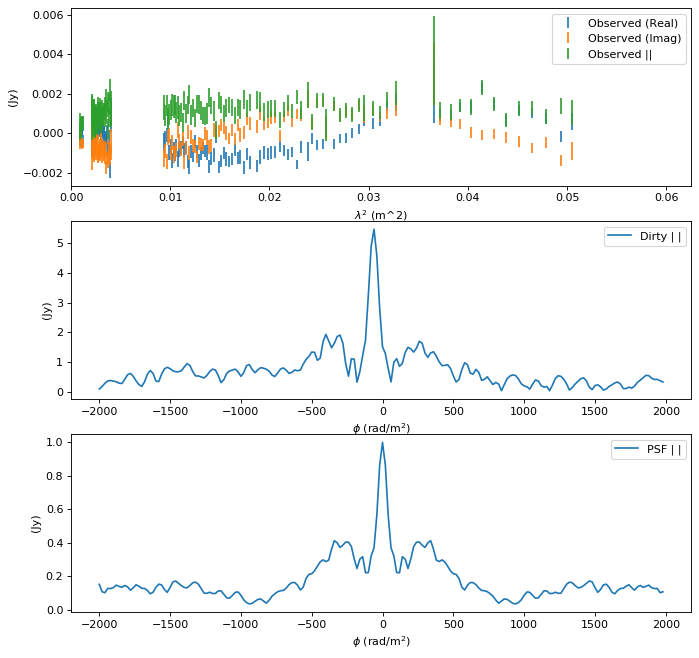

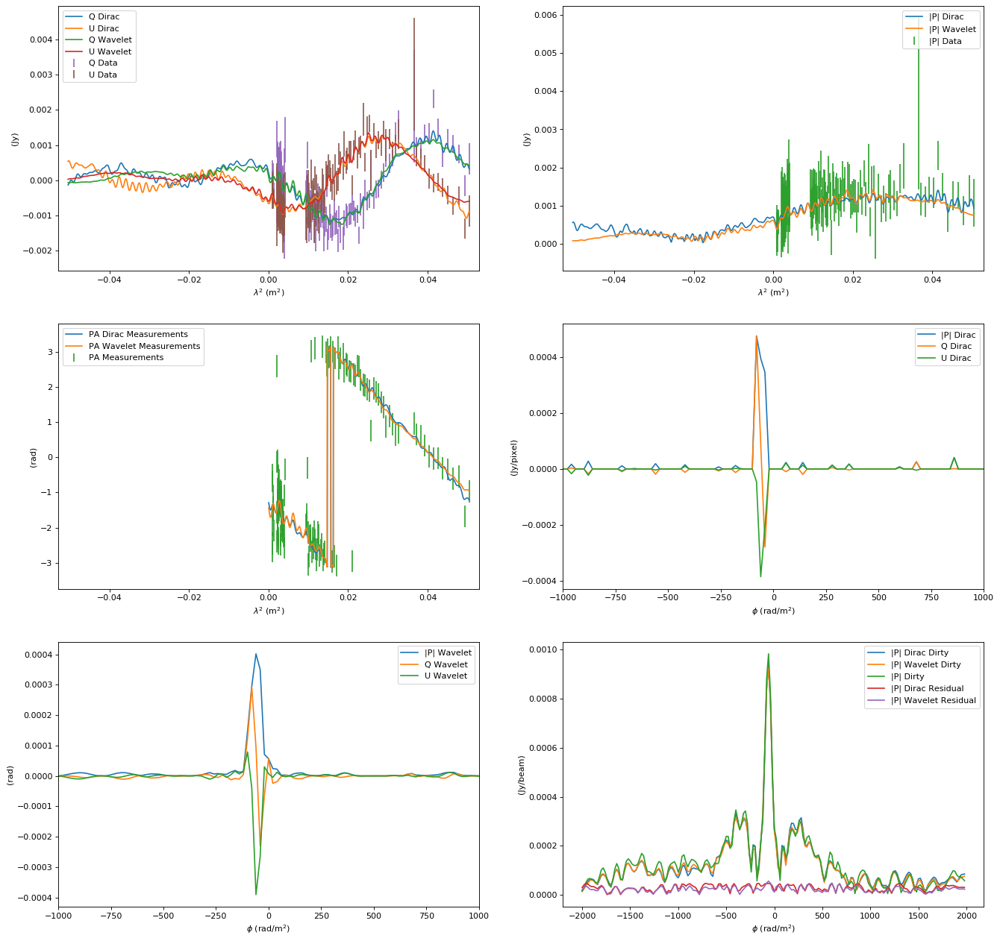

In [8]:
source = sources[2]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1.
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_c1152'
74
2020-08-09 15:06:36,528 - Faraday Dreams - INFO - φ resolution 24.8197780303997 rad/m^2.
2020-08-09 15:06:36,528 - Faraday Dreams - INFO - φ max range is 8010.793958618504 rad/m^2.
2020-08-09 15:06:36,529 - Faraday Dreams - INFO - φ min range is 902.5653460998063 rad/m^2.
2020-08-09 15:06:36,541 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:06:36,541 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:06:36,543 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2020-08-09 15:06:36,544 - Optimus Primal - INFO - [Power Method] iter = 21, tol = 0.0
2020-08-09 15:06:36,546 - Optimus Primal - INFO - [Power Method] iter = 31, tol = 0.0
2020-08-09 15:06:36,547 - Optimus Primal - INFO - [Power Method] Converged with iter = 38, tol = 9.002187498246708e-05
2020-08-09 15:06:36,548 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:06:36,549 - Faraday Dreams - INFO - Using an estimated noise level of 9.5

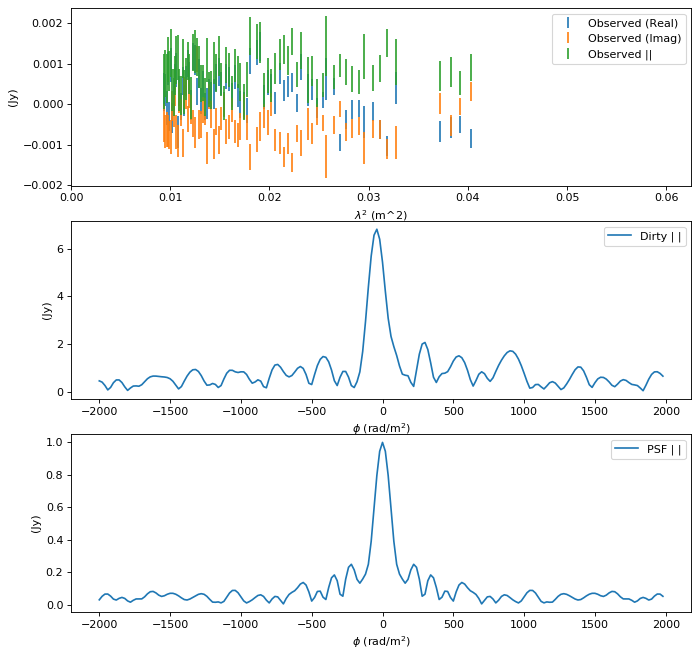

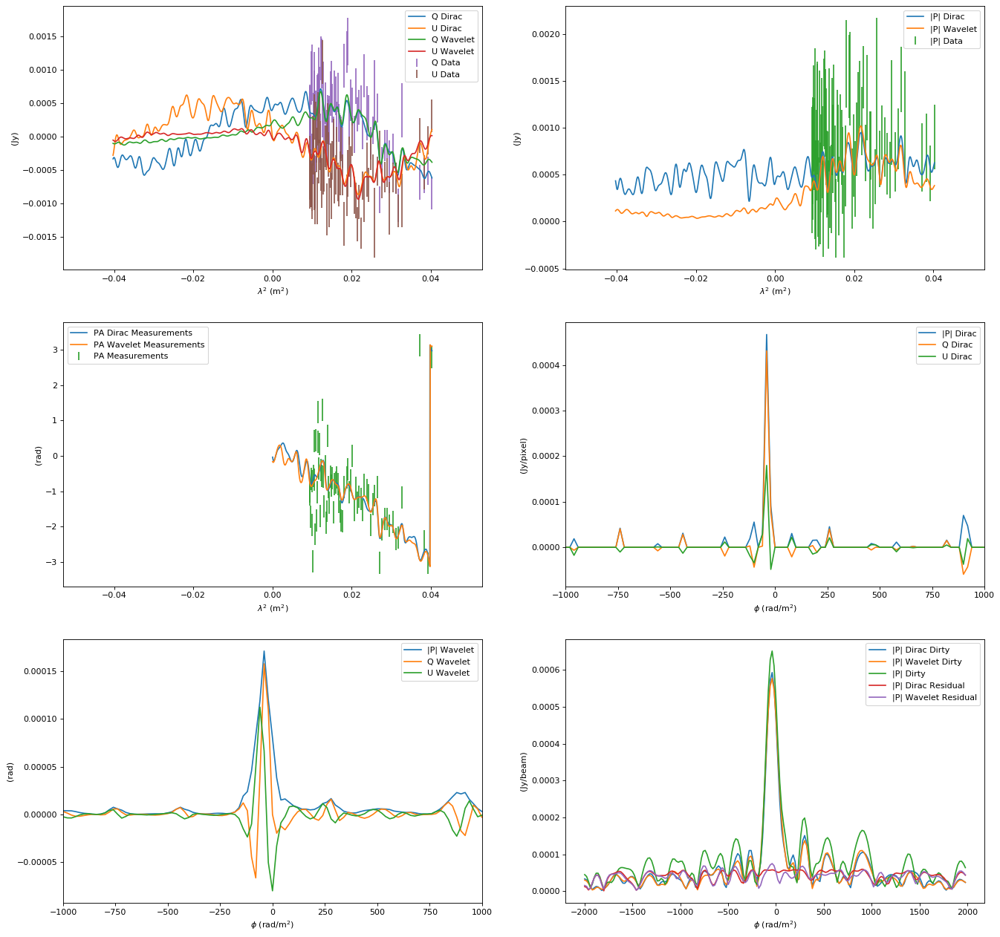

In [9]:
source = sources[3]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 0.8
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_c1435'
127
2020-08-09 15:06:58,808 - Faraday Dreams - INFO - φ resolution 21.027909528065774 rad/m^2.
2020-08-09 15:06:58,809 - Faraday Dreams - INFO - φ max range is 77148.28574856605 rad/m^2.
2020-08-09 15:06:58,810 - Faraday Dreams - INFO - φ min range is 703.8312784514167 rad/m^2.
2020-08-09 15:06:58,841 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:06:58,842 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:06:58,844 - Optimus Primal - INFO - [Power Method] Converged with iter = 8, tol = 2.8471076917642657e-05
2020-08-09 15:06:58,845 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:06:58,845 - Faraday Dreams - INFO - Using an estimated noise level of 0.0002246914809802547 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:06:58,846 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2020-08-09 15:06:58,847 - Optimus Primal - INFO - Running Forward Backward Primal Du

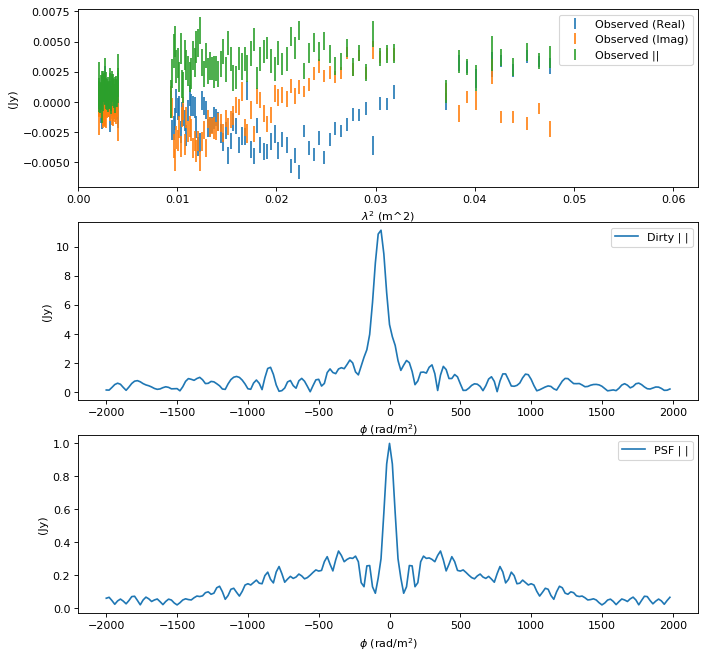

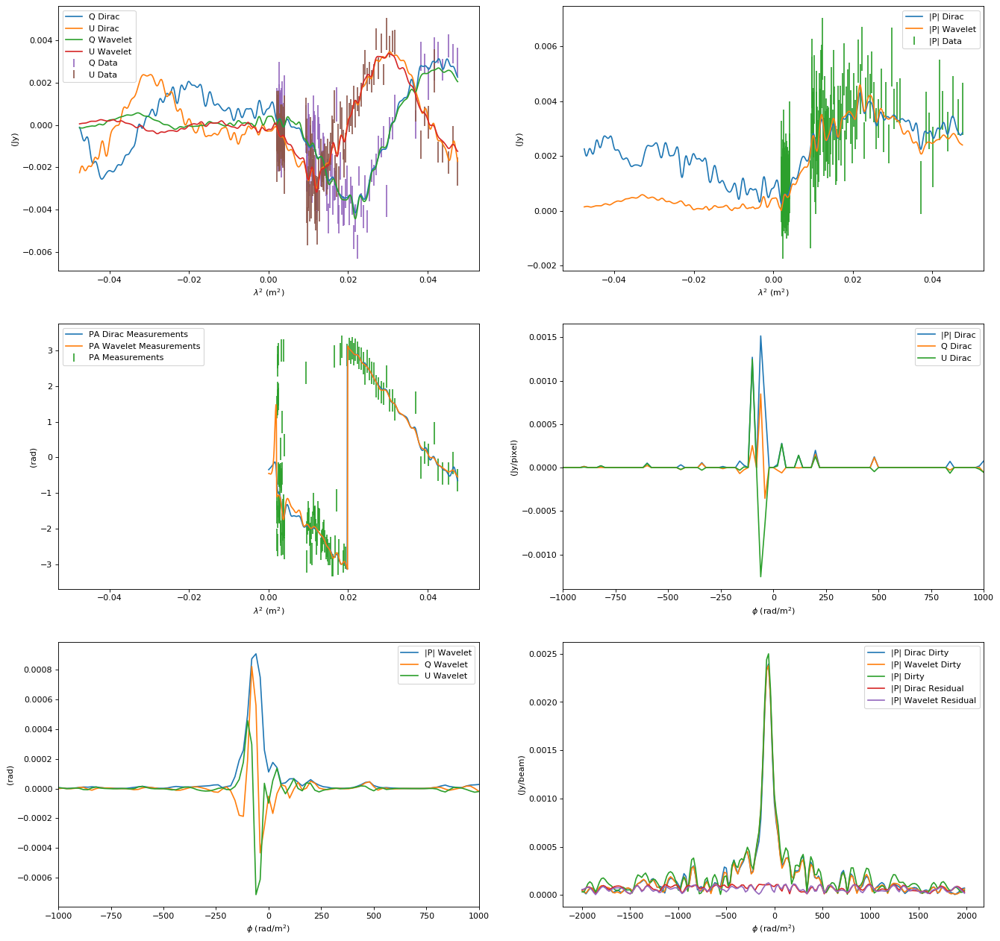

In [10]:
source = sources[4]
print(source)
wav = ['db4', 'db6', 'db8']
levels = 1
sig_factor = 0.5
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_c1466'
123
2020-08-09 15:07:13,358 - Faraday Dreams - INFO - φ resolution 21.028129387127045 rad/m^2.
2020-08-09 15:07:13,359 - Faraday Dreams - INFO - φ max range is 279264.1366969024 rad/m^2.
2020-08-09 15:07:13,360 - Faraday Dreams - INFO - φ min range is 703.8423177511336 rad/m^2.
2020-08-09 15:07:13,385 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:07:13,386 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:07:13,388 - Optimus Primal - INFO - [Power Method] Converged with iter = 6, tol = 5.3439760034488105e-05
2020-08-09 15:07:13,389 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:07:13,390 - Faraday Dreams - INFO - Using an estimated noise level of 0.0001487546687712893 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:07:13,391 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2020-08-09 15:07:13,392 - Optimus Primal - INFO - Running Forward Backward Primal Du

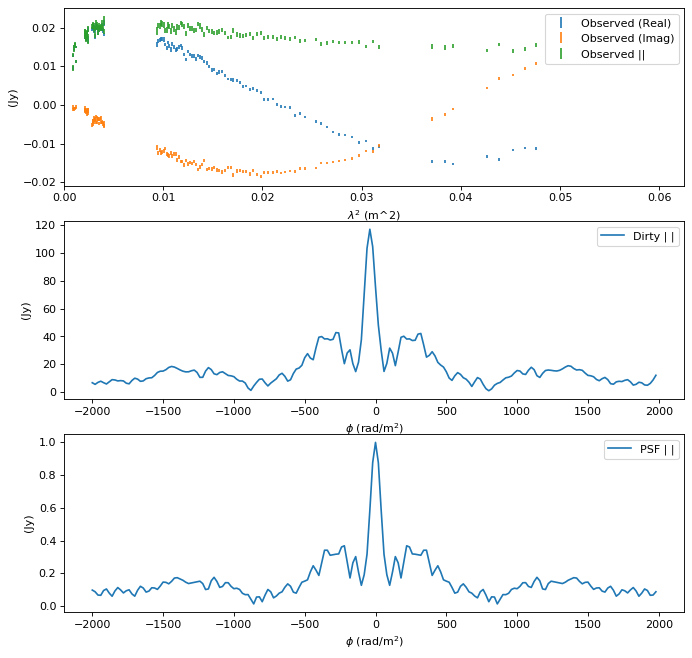

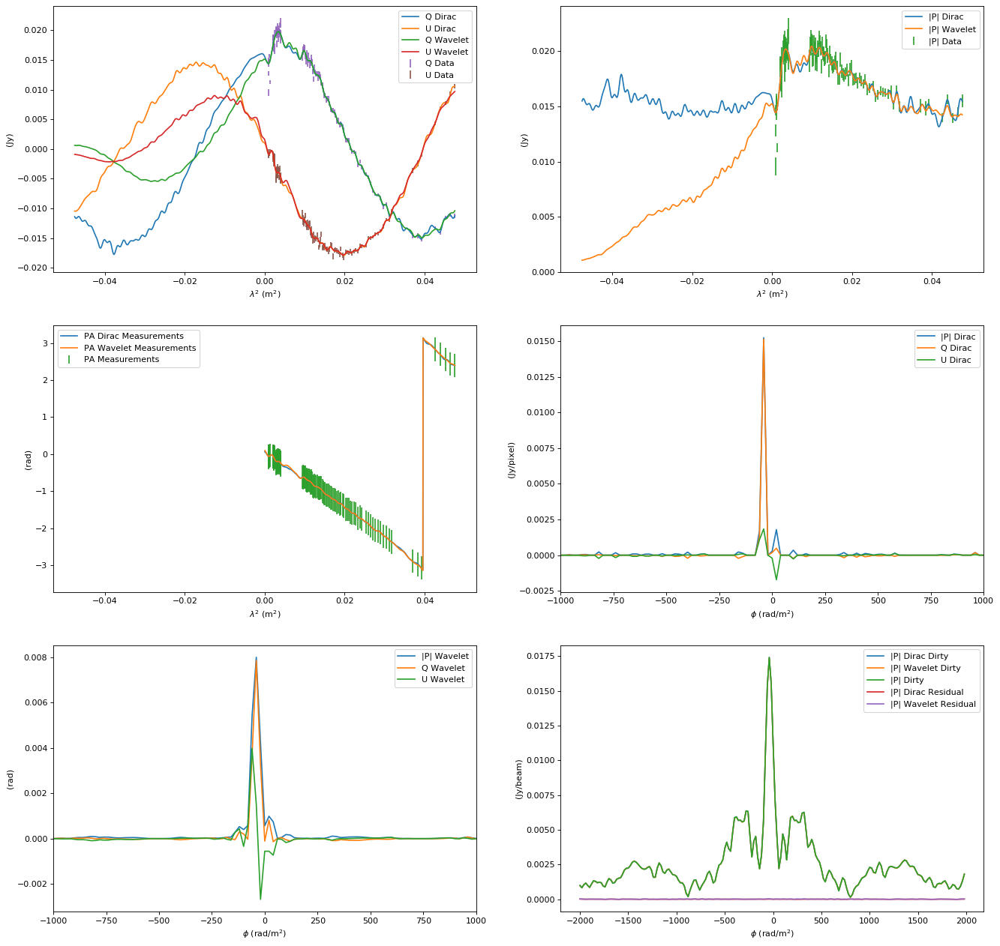

In [11]:
source = sources[5]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-2, 1e-2
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_c1573'
136
2020-08-09 15:07:23,005 - Faraday Dreams - INFO - φ resolution 20.88981460415885 rad/m^2.
2020-08-09 15:07:23,006 - Faraday Dreams - INFO - φ max range is 279287.80934454635 rad/m^2.
2020-08-09 15:07:23,008 - Faraday Dreams - INFO - φ min range is 696.9088370972838 rad/m^2.
2020-08-09 15:07:23,046 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:07:23,047 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:07:23,055 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2020-08-09 15:07:23,058 - Optimus Primal - INFO - [Power Method] iter = 21, tol = 0.0
2020-08-09 15:07:23,064 - Optimus Primal - INFO - [Power Method] Converged with iter = 28, tol = 7.428702274608316e-05
2020-08-09 15:07:23,065 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:07:23,066 - Faraday Dreams - INFO - Using an estimated noise level of 0.00011901444668183103 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:07:23,068 - 

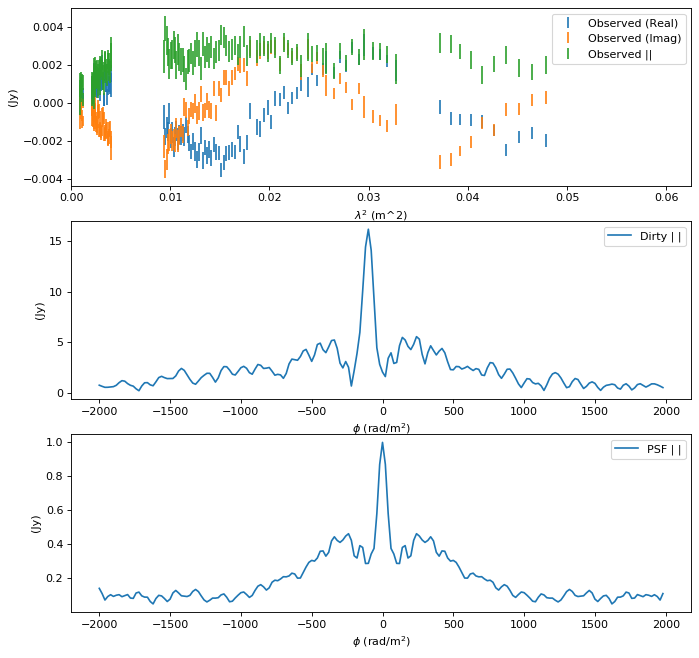

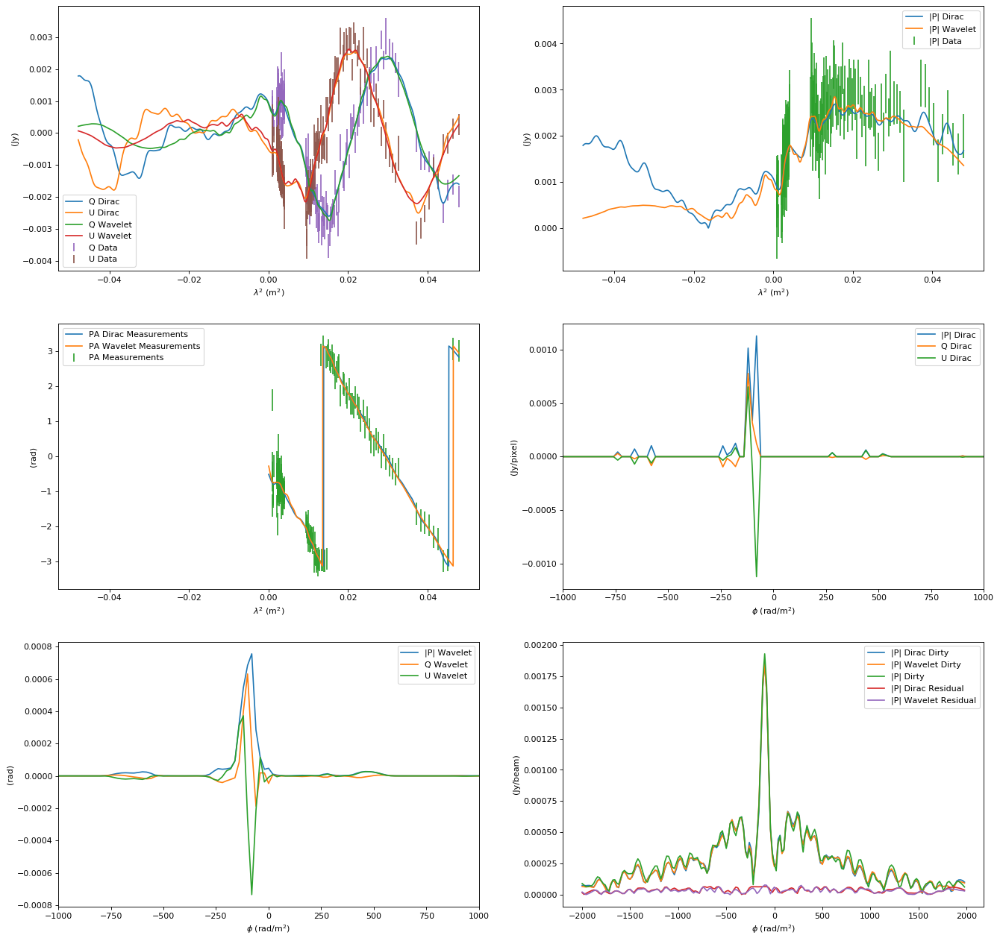

In [12]:
source = sources[6]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_c1636'
126
2020-08-09 15:07:39,615 - Faraday Dreams - INFO - φ resolution 21.02784671140223 rad/m^2.
2020-08-09 15:07:39,616 - Faraday Dreams - INFO - φ max range is 77147.20219561922 rad/m^2.
2020-08-09 15:07:39,616 - Faraday Dreams - INFO - φ min range is 703.8281243869868 rad/m^2.
2020-08-09 15:07:39,641 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:07:39,642 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:07:39,644 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2020-08-09 15:07:39,645 - Optimus Primal - INFO - [Power Method] Converged with iter = 17, tol = 8.31409494949808e-05
2020-08-09 15:07:39,646 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:07:39,646 - Faraday Dreams - INFO - Using an estimated noise level of 7.668026955798268e-05 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:07:39,647 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization


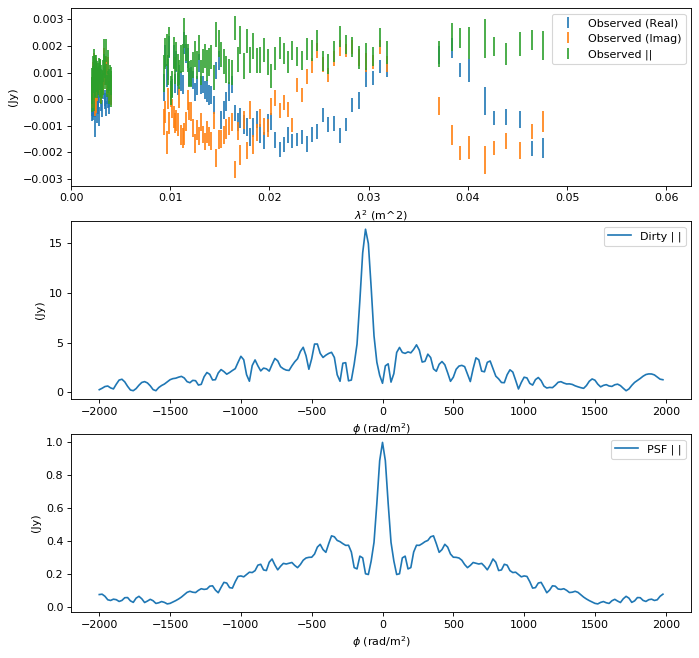

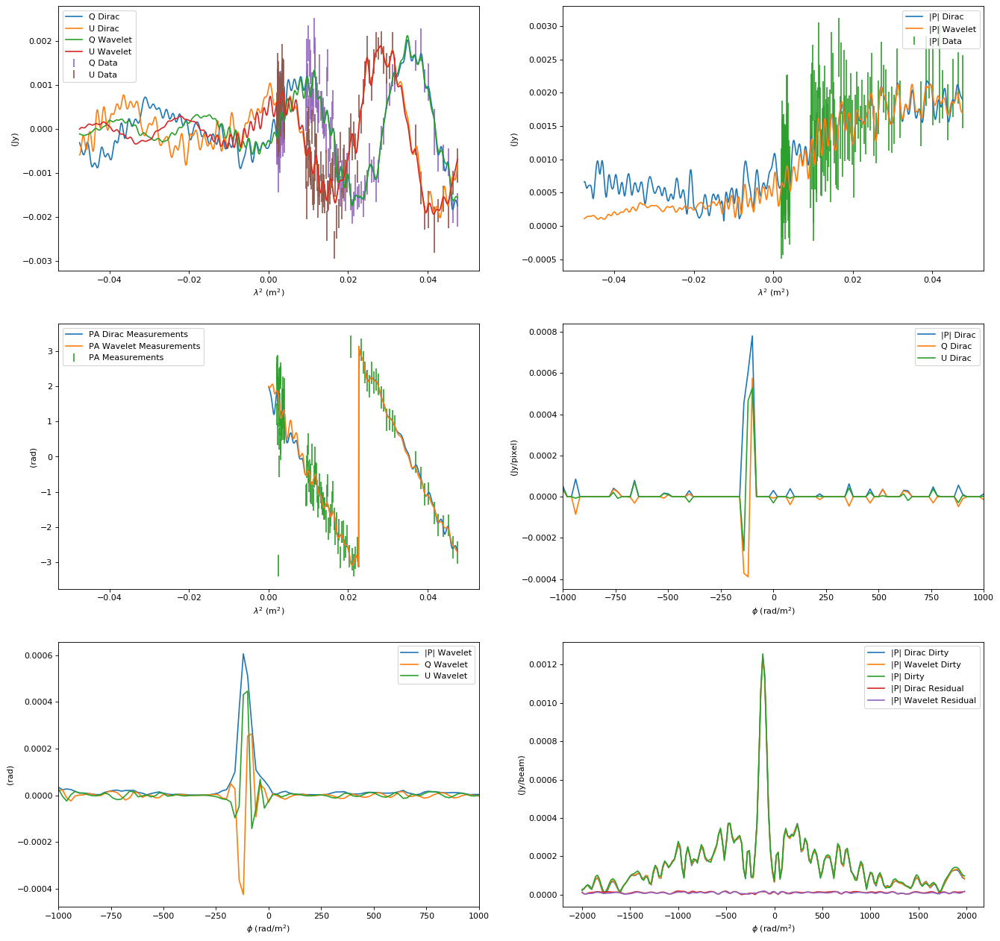

In [13]:
source = sources[7]
print(source)
wav = ["db8", "db6", "db4"]
levels = 1
sig_factor = 1.
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_c1640'
130
2020-08-09 15:07:48,966 - Faraday Dreams - INFO - φ resolution 19.841563423731 rad/m^2.
2020-08-09 15:07:48,967 - Faraday Dreams - INFO - φ max range is 77167.71918720336 rad/m^2.
2020-08-09 15:07:48,967 - Faraday Dreams - INFO - φ min range is 645.1123423930359 rad/m^2.
2020-08-09 15:07:48,989 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:07:48,990 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:07:48,992 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2020-08-09 15:07:48,993 - Optimus Primal - INFO - [Power Method] Converged with iter = 15, tol = 8.485639202298738e-05
2020-08-09 15:07:48,993 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:07:48,994 - Faraday Dreams - INFO - Using an estimated noise level of 0.0004703365557361394 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:07:48,995 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2

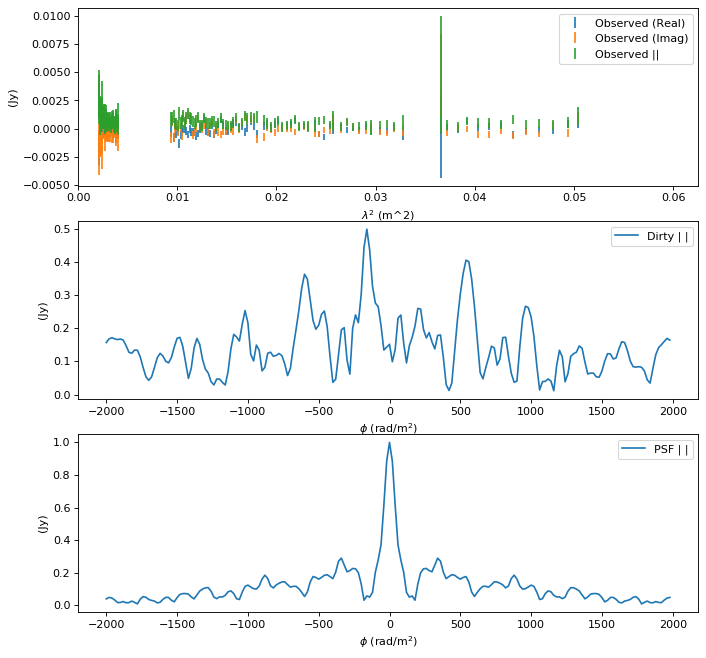

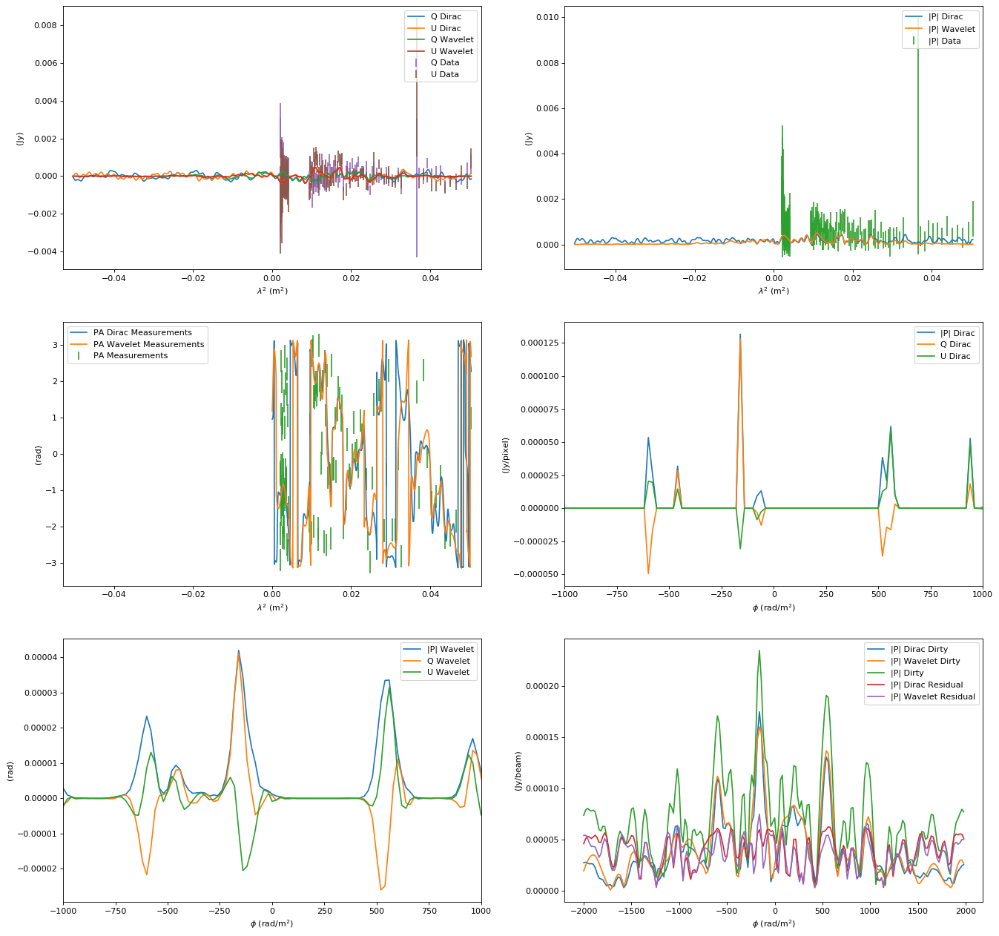

In [14]:
source = sources[8]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1.
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_c1748'
141
2020-08-09 15:07:54,526 - Faraday Dreams - INFO - φ resolution 23.465132280728092 rad/m^2.
2020-08-09 15:07:54,527 - Faraday Dreams - INFO - φ max range is 279268.99033219344 rad/m^2.
2020-08-09 15:07:54,527 - Faraday Dreams - INFO - φ min range is 829.6863701446905 rad/m^2.
2020-08-09 15:07:54,559 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:07:54,560 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:07:54,562 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2020-08-09 15:07:54,565 - Optimus Primal - INFO - [Power Method] iter = 21, tol = 0.0
2020-08-09 15:07:54,566 - Optimus Primal - INFO - [Power Method] Converged with iter = 22, tol = 8.878028430187641e-05
2020-08-09 15:07:54,567 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:07:54,568 - Faraday Dreams - INFO - Using an estimated noise level of 9.665577090345323e-05 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:07:54,568 - 

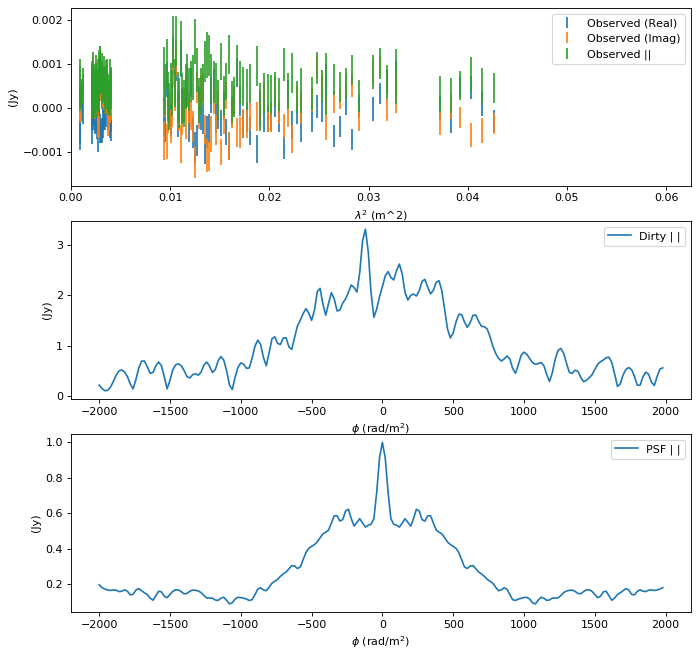

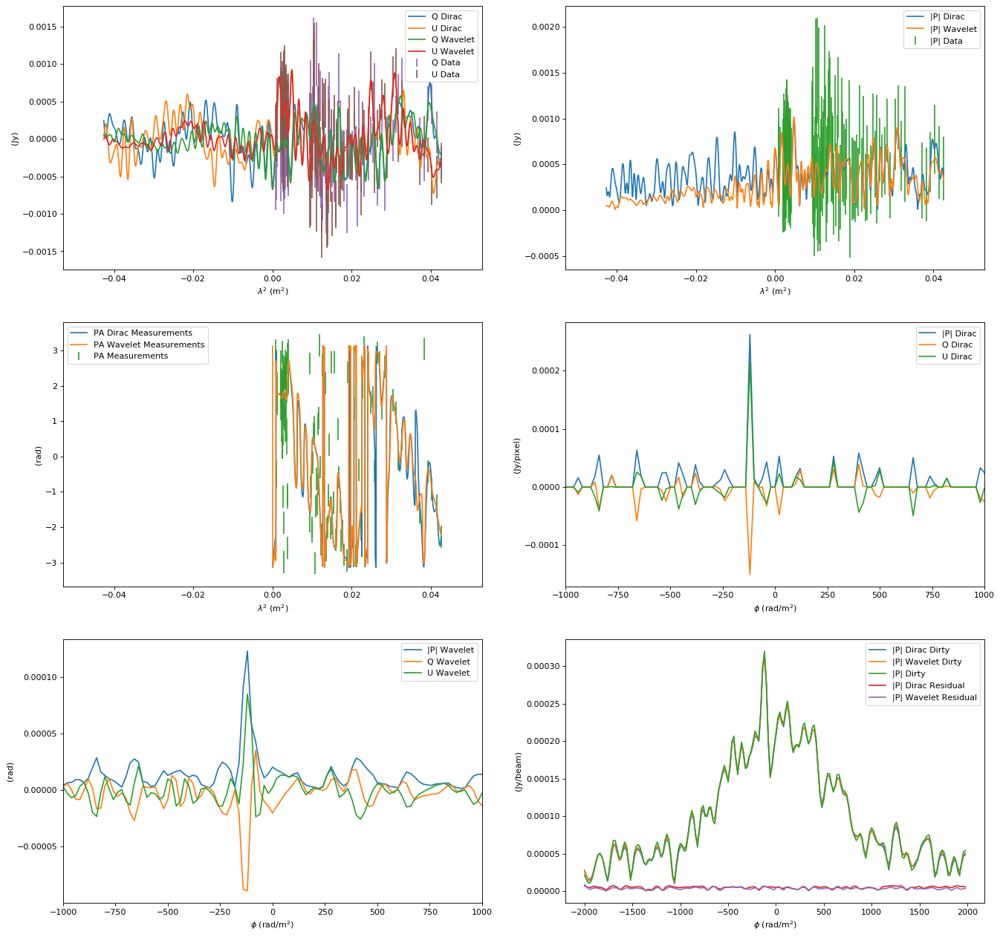

In [15]:
source = sources[9]
print(source)
wav = ["db8", "db6", "db4"]
levels = 1
sig_factor = 0.8
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-4, 1e-4
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_c1764'
126
2020-08-09 15:08:16,636 - Faraday Dreams - INFO - φ resolution 21.027595445686337 rad/m^2.
2020-08-09 15:08:16,636 - Faraday Dreams - INFO - φ max range is 77147.92456312789 rad/m^2.
2020-08-09 15:08:16,637 - Faraday Dreams - INFO - φ min range is 703.815508223484 rad/m^2.
2020-08-09 15:08:16,659 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:08:16,660 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:08:16,661 - Optimus Primal - INFO - [Power Method] Converged with iter = 11, tol = 7.803362915874214e-05
2020-08-09 15:08:16,662 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:08:16,663 - Faraday Dreams - INFO - Using an estimated noise level of 0.0002510356949642301 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:08:16,664 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2020-08-09 15:08:16,664 - Optimus Primal - INFO - Running Forward Backward Primal Dua

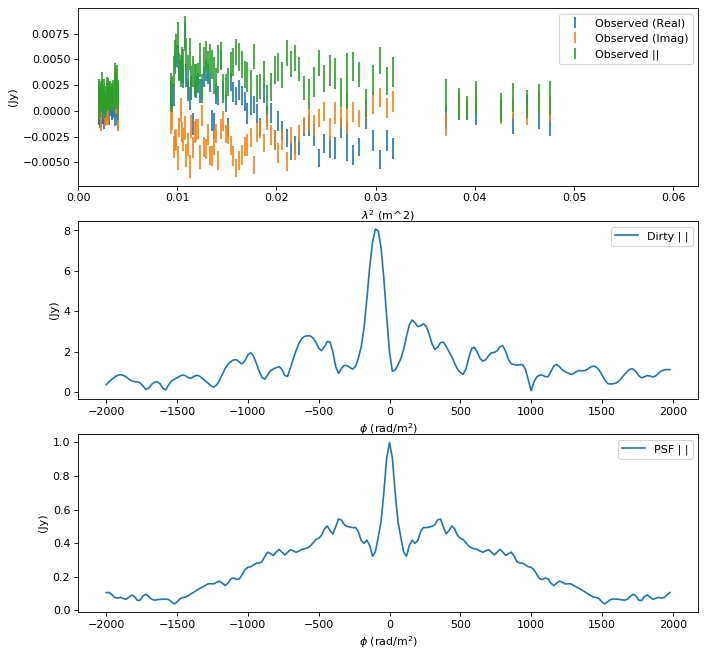

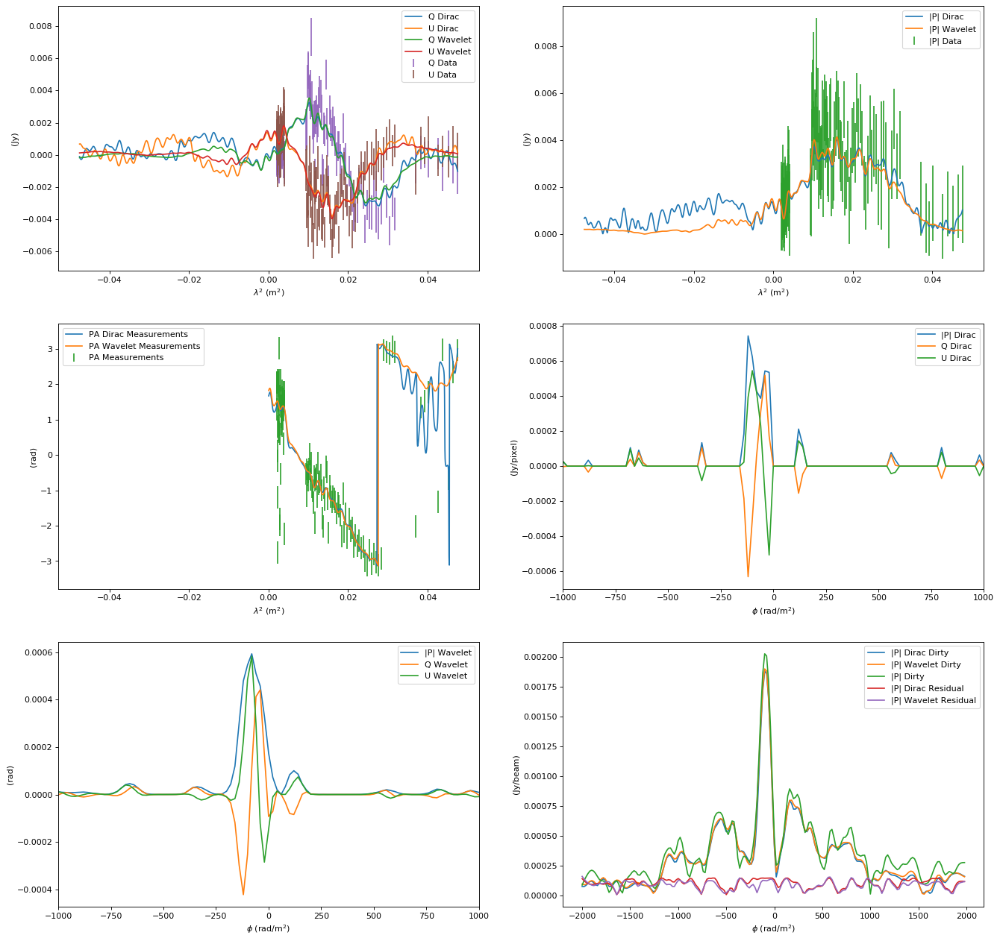

In [16]:
source = sources[10]
print(source)
wav = ["db8", "db6", "db4"]
levels = 1
sig_factor = 0.4
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_c1827'
128
2020-08-09 15:08:21,944 - Faraday Dreams - INFO - φ resolution 21.027878119722274 rad/m^2.
2020-08-09 15:08:21,945 - Faraday Dreams - INFO - φ max range is 279329.28227902803 rad/m^2.
2020-08-09 15:08:21,945 - Faraday Dreams - INFO - φ min range is 703.8297014180228 rad/m^2.
2020-08-09 15:08:21,966 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:08:21,967 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:08:21,968 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2020-08-09 15:08:21,970 - Optimus Primal - INFO - [Power Method] iter = 21, tol = 0.0
2020-08-09 15:08:21,970 - Optimus Primal - INFO - [Power Method] Converged with iter = 25, tol = 8.428168547666522e-05
2020-08-09 15:08:21,971 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:08:21,972 - Faraday Dreams - INFO - Using an estimated noise level of 0.00019677587260957807 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:08:21,973 -

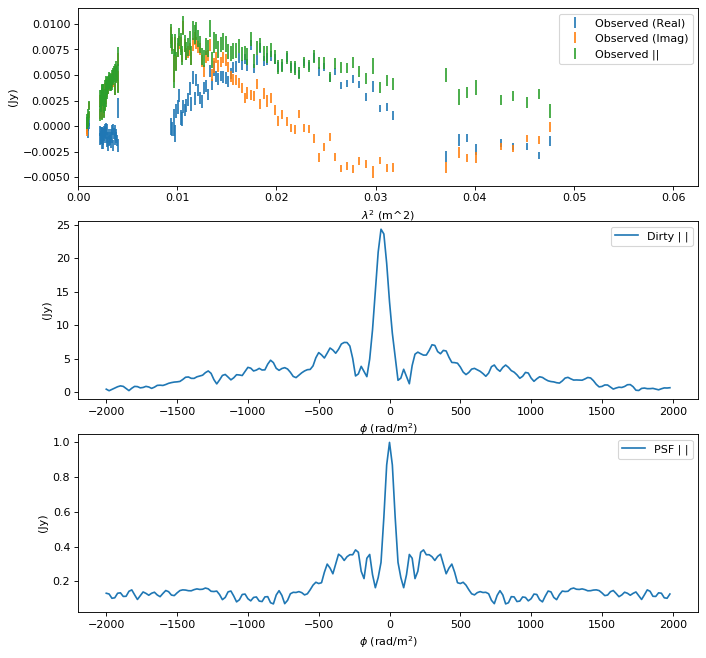

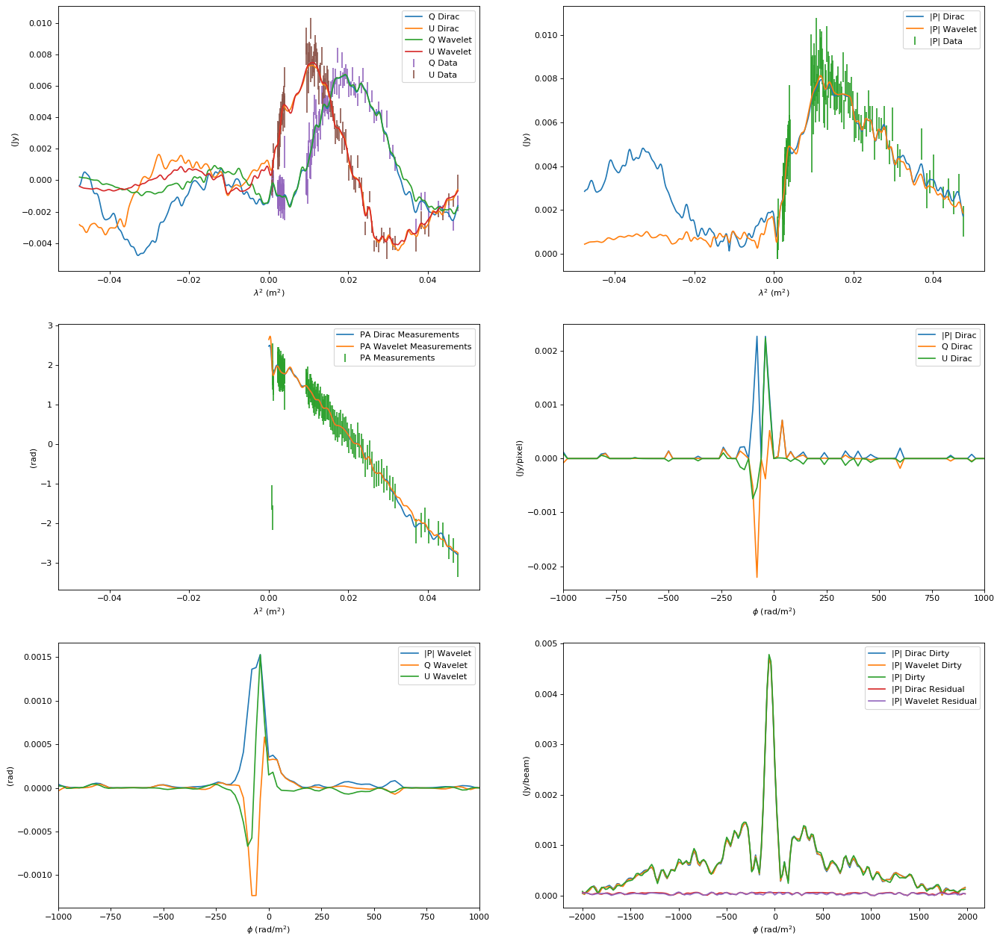

In [17]:
source = sources[11]
print(source)
wav = ["db8", "db6", "db4"]
levels = 1
sig_factor = 0.5
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_c1832'
128
2020-08-09 15:08:38,850 - Faraday Dreams - INFO - φ resolution 20.26791149325624 rad/m^2.
2020-08-09 15:08:38,851 - Faraday Dreams - INFO - φ max range is 77165.94909210865 rad/m^2.
2020-08-09 15:08:38,851 - Faraday Dreams - INFO - φ min range is 666.0181973331584 rad/m^2.
2020-08-09 15:08:38,870 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:08:38,871 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:08:38,872 - Optimus Primal - INFO - [Power Method] Converged with iter = 11, tol = 7.381018006340479e-05
2020-08-09 15:08:38,873 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:08:38,873 - Faraday Dreams - INFO - Using an estimated noise level of 0.00010389637900516392 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:08:38,874 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2020-08-09 15:08:38,875 - Optimus Primal - INFO - Running Forward Backward Primal Du

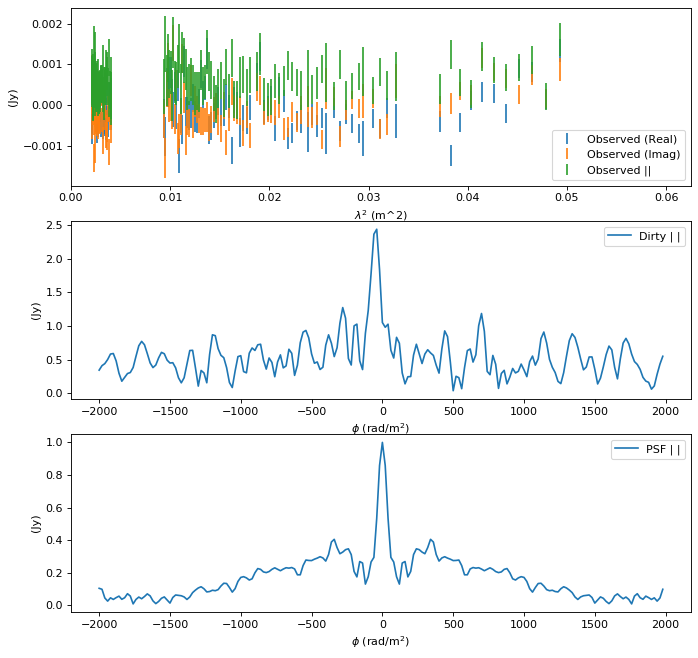

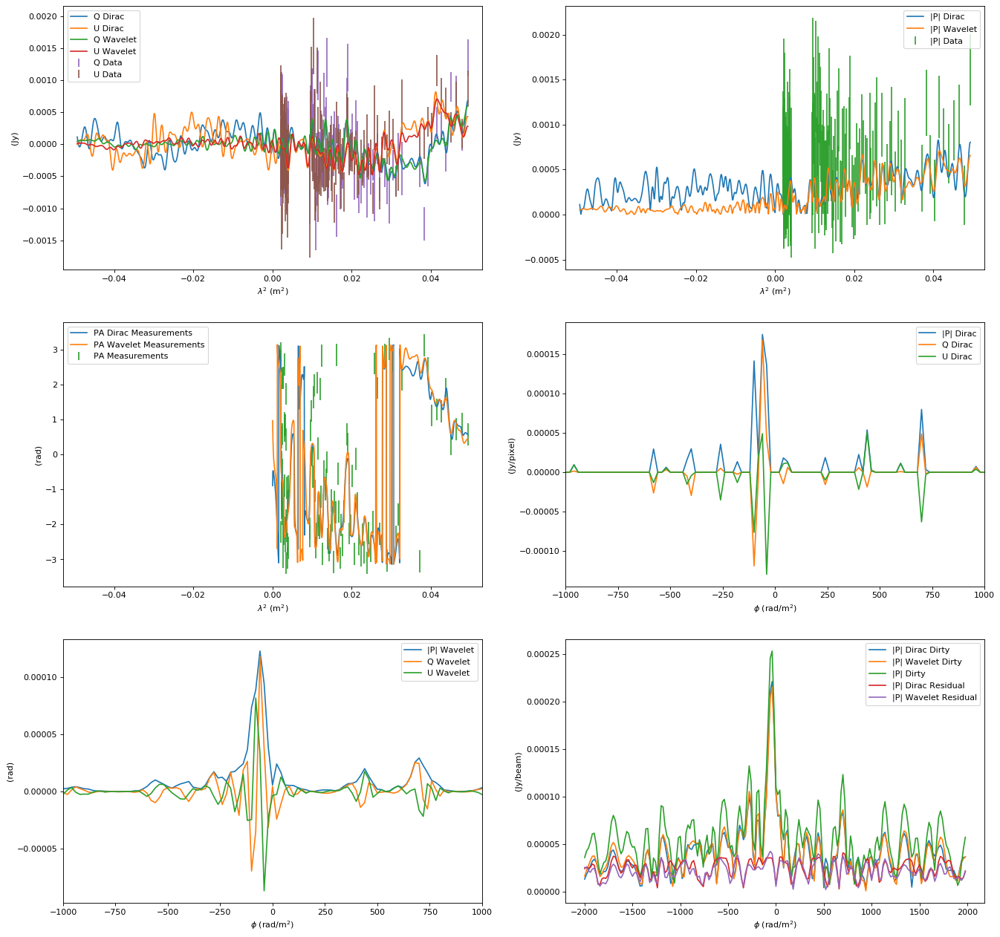

In [18]:
source = sources[12]
print(source)
wav = ["db8", "db6", "db4"]
levels = 1
sig_factor = 0.8
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_c1972'
106
2020-08-09 15:08:48,757 - Faraday Dreams - INFO - φ resolution 20.318914697363482 rad/m^2.
2020-08-09 15:08:48,758 - Faraday Dreams - INFO - φ max range is 279256.13257910084 rad/m^2.
2020-08-09 15:08:48,758 - Faraday Dreams - INFO - φ min range is 668.5339756224641 rad/m^2.
2020-08-09 15:08:48,774 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:08:48,775 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:08:48,777 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2020-08-09 15:08:48,778 - Optimus Primal - INFO - [Power Method] Converged with iter = 21, tol = 5.737425523971927e-05
2020-08-09 15:08:48,779 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:08:48,779 - Faraday Dreams - INFO - Using an estimated noise level of 0.00012695739860646427 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:08:48,780 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularizat

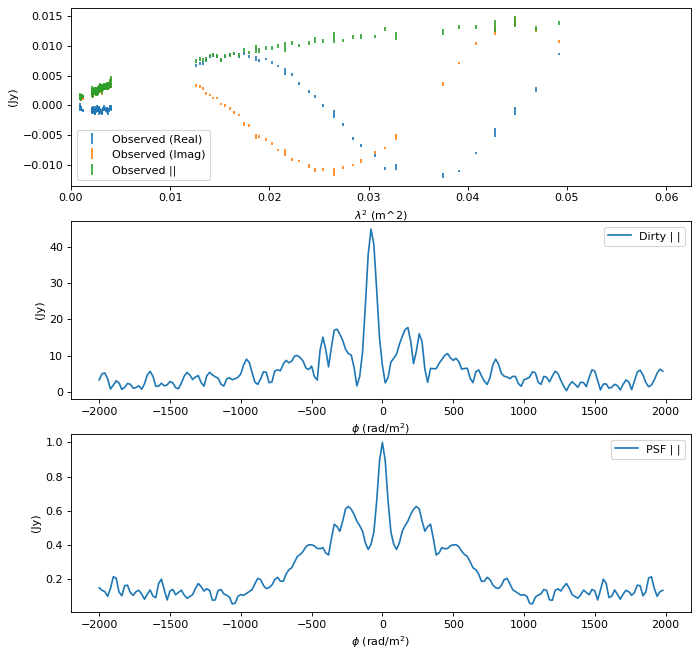

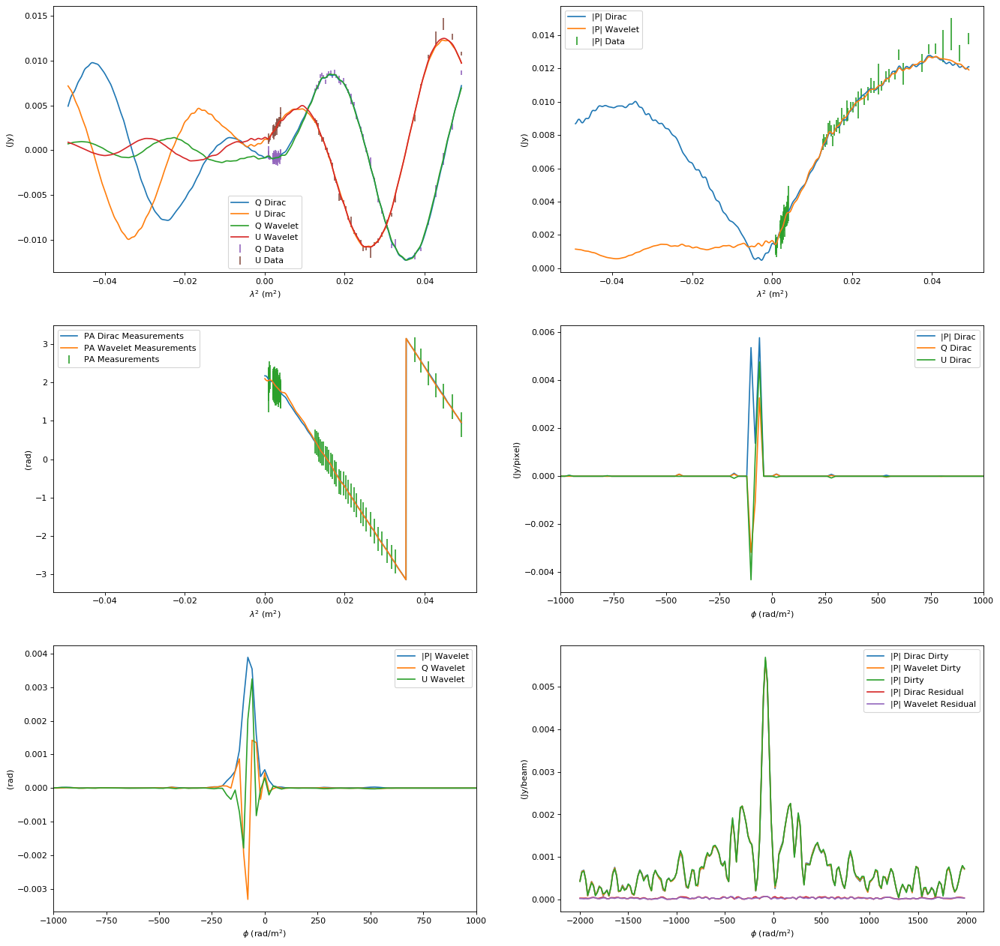

In [19]:
source = sources[13]
print(source)
wav = ["db8", "db6", "db4"]
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_s1014'
79
2020-08-09 15:08:53,401 - Faraday Dreams - INFO - φ resolution 21.5198761666823 rad/m^2.
2020-08-09 15:08:53,402 - Faraday Dreams - INFO - φ max range is 8009.4933987271115 rad/m^2.
2020-08-09 15:08:53,403 - Faraday Dreams - INFO - φ min range is 728.6771865192311 rad/m^2.
2020-08-09 15:08:53,414 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:08:53,415 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:08:53,416 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2020-08-09 15:08:53,417 - Optimus Primal - INFO - [Power Method] iter = 21, tol = 0.0
2020-08-09 15:08:53,418 - Optimus Primal - INFO - [Power Method] iter = 31, tol = 0.0
2020-08-09 15:08:53,420 - Optimus Primal - INFO - [Power Method] iter = 41, tol = 0.0
2020-08-09 15:08:53,421 - Optimus Primal - INFO - [Power Method] iter = 51, tol = 0.0
2020-08-09 15:08:53,422 - Optimus Primal - INFO - [Power Method] iter = 61, tol = 0.0
2020-08-09 15:08:53,423 - Optimus Pr

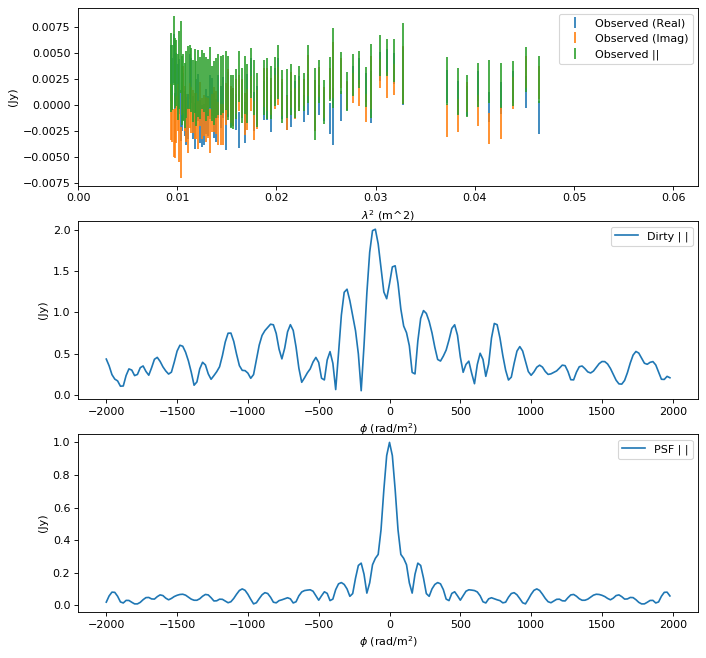

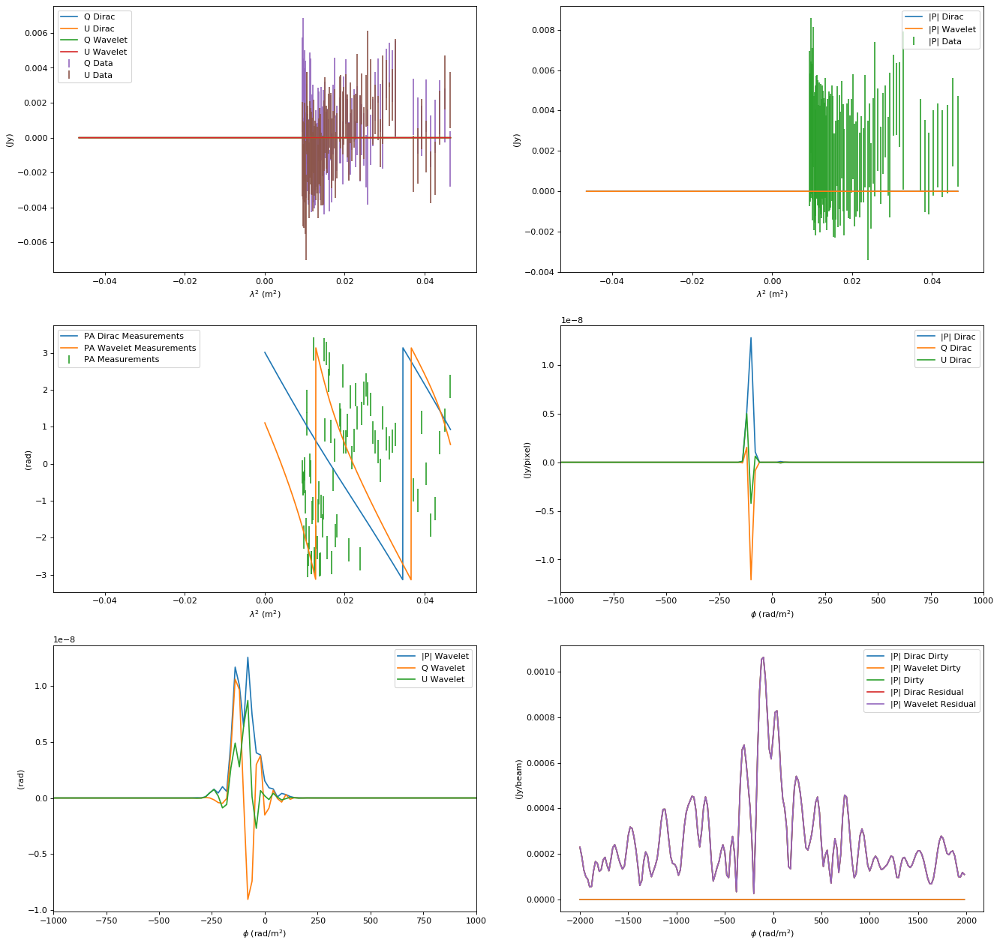

In [20]:
source = sources[14]
print(source)
wav = ["db8", "db6", "db4"]
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_s1031'
130
2020-08-09 15:08:55,283 - Faraday Dreams - INFO - φ resolution 19.82179819254316 rad/m^2.
2020-08-09 15:08:55,284 - Faraday Dreams - INFO - φ max range is 77167.2856920226 rad/m^2.
2020-08-09 15:08:55,284 - Faraday Dreams - INFO - φ min range is 644.1485607464031 rad/m^2.
2020-08-09 15:08:55,305 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:08:55,307 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:08:55,308 - Optimus Primal - INFO - [Power Method] Converged with iter = 8, tol = 4.9297250898286175e-05
2020-08-09 15:08:55,309 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:08:55,309 - Faraday Dreams - INFO - Using an estimated noise level of 0.00015556170546915382 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:08:55,310 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2020-08-09 15:08:55,311 - Optimus Primal - INFO - Running Forward Backward Primal Dua

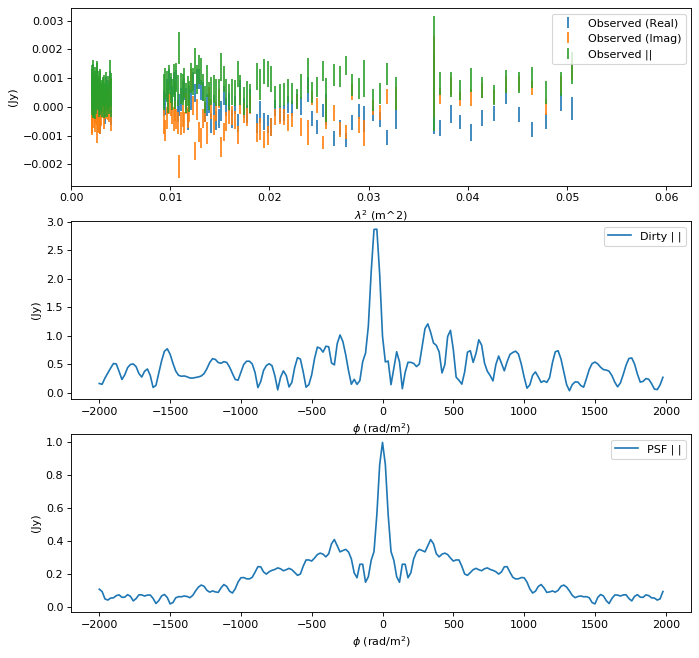

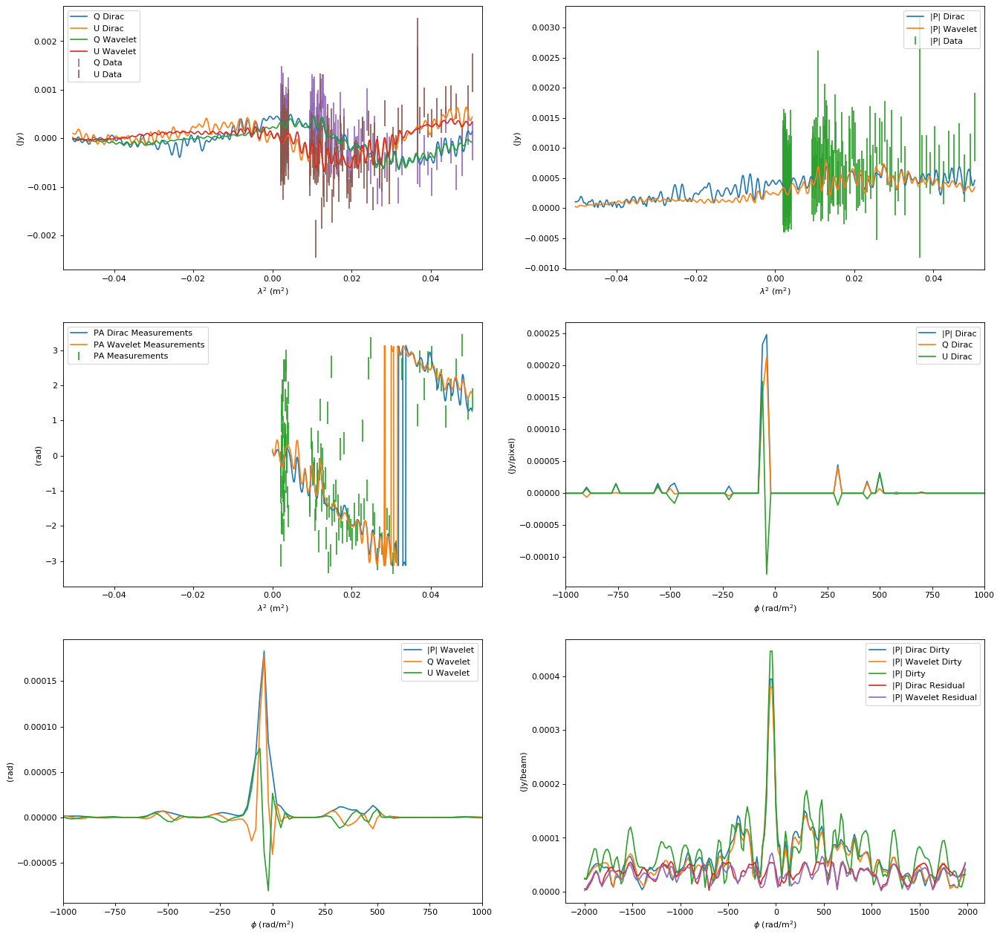

In [21]:
source = sources[15]
print(source)
wav = ["db8", "db6", "db4"]
levels = 1
sig_factor = 1.
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_s1290'
136
2020-08-09 15:08:58,488 - Faraday Dreams - INFO - φ resolution 21.028097978619343 rad/m^2.
2020-08-09 15:08:58,489 - Faraday Dreams - INFO - φ max range is 279370.84449167305 rad/m^2.
2020-08-09 15:08:58,490 - Faraday Dreams - INFO - φ min range is 703.8407407012481 rad/m^2.
2020-08-09 15:08:58,511 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:08:58,512 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:08:58,513 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2020-08-09 15:08:58,515 - Optimus Primal - INFO - [Power Method] iter = 21, tol = 0.0
2020-08-09 15:08:58,516 - Optimus Primal - INFO - [Power Method] Converged with iter = 23, tol = 9.747042761791275e-05
2020-08-09 15:08:58,517 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:08:58,518 - Faraday Dreams - INFO - Using an estimated noise level of 9.67267551459372e-05 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:08:58,519 - F

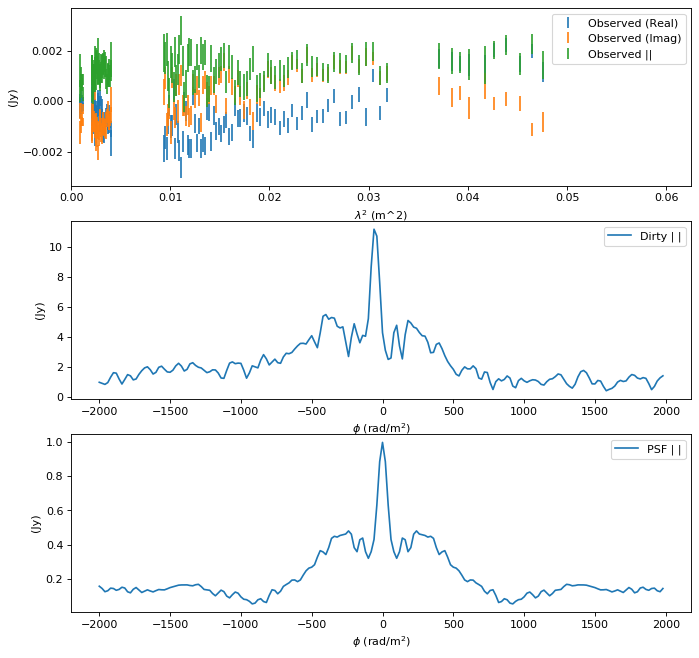

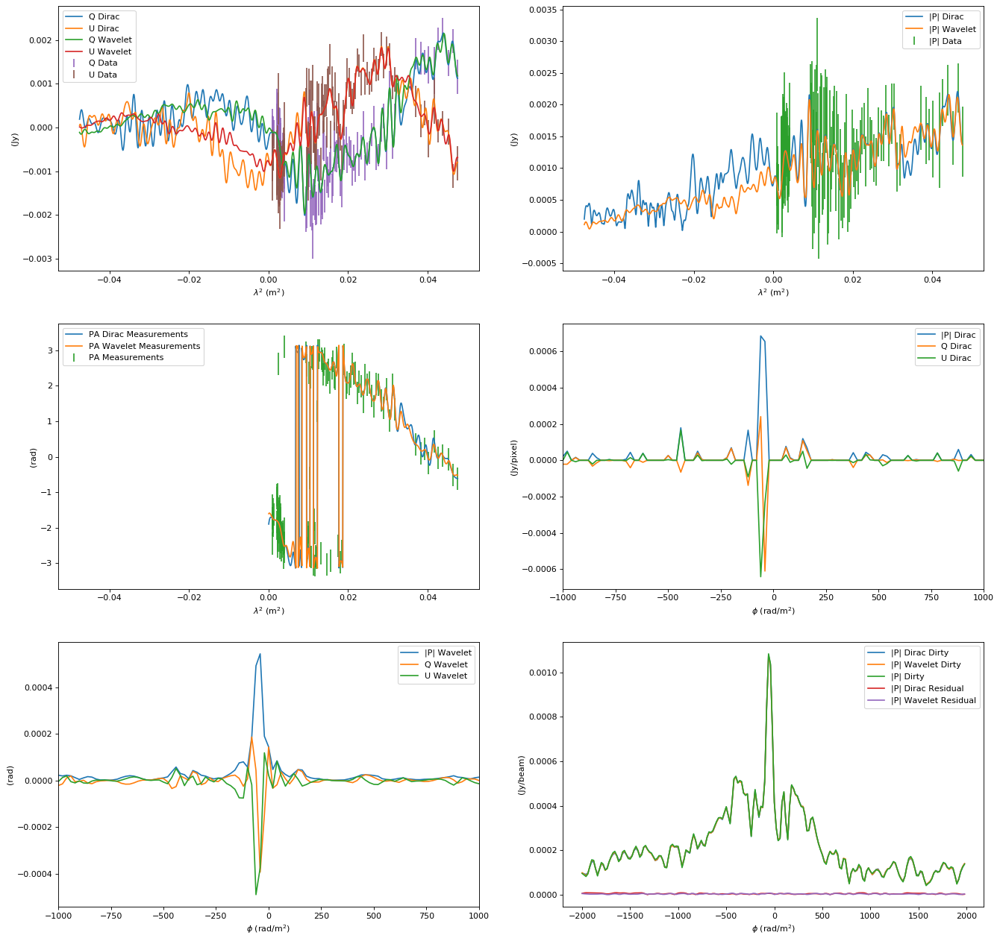

In [22]:
source = sources[16]
print(source)
wav = ["db8", "db6", "db4"]
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_s1349'
133
2020-08-09 15:09:03,035 - Faraday Dreams - INFO - φ resolution 22.11923980653031 rad/m^2.
2020-08-09 15:09:03,036 - Faraday Dreams - INFO - φ max range is 279337.62845813745 rad/m^2.
2020-08-09 15:09:03,036 - Faraday Dreams - INFO - φ min range is 759.3326939422597 rad/m^2.
2020-08-09 15:09:03,056 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:09:03,057 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:09:03,060 - Optimus Primal - INFO - [Power Method] Converged with iter = 5, tol = 3.5898072785515e-05
2020-08-09 15:09:03,061 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:09:03,062 - Faraday Dreams - INFO - Using an estimated noise level of 0.00027627250528894365 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:09:03,063 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2020-08-09 15:09:03,064 - Optimus Primal - INFO - Running Forward Backward Primal Dual

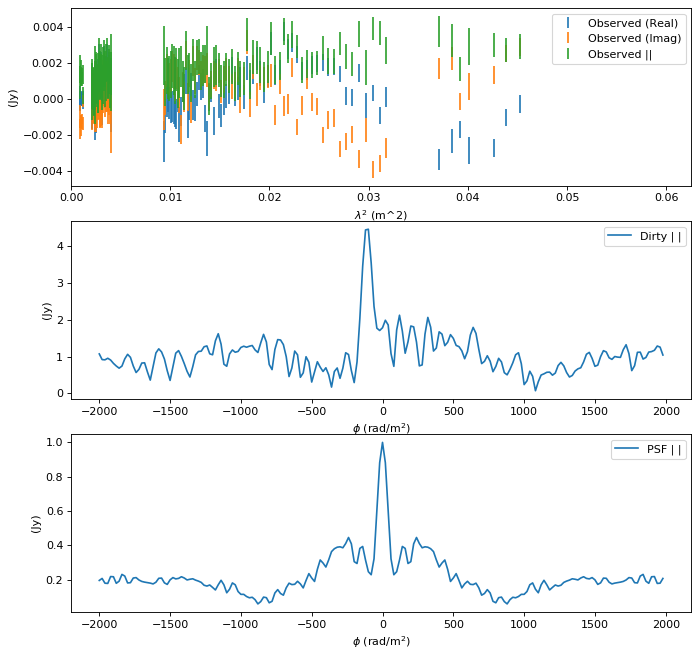

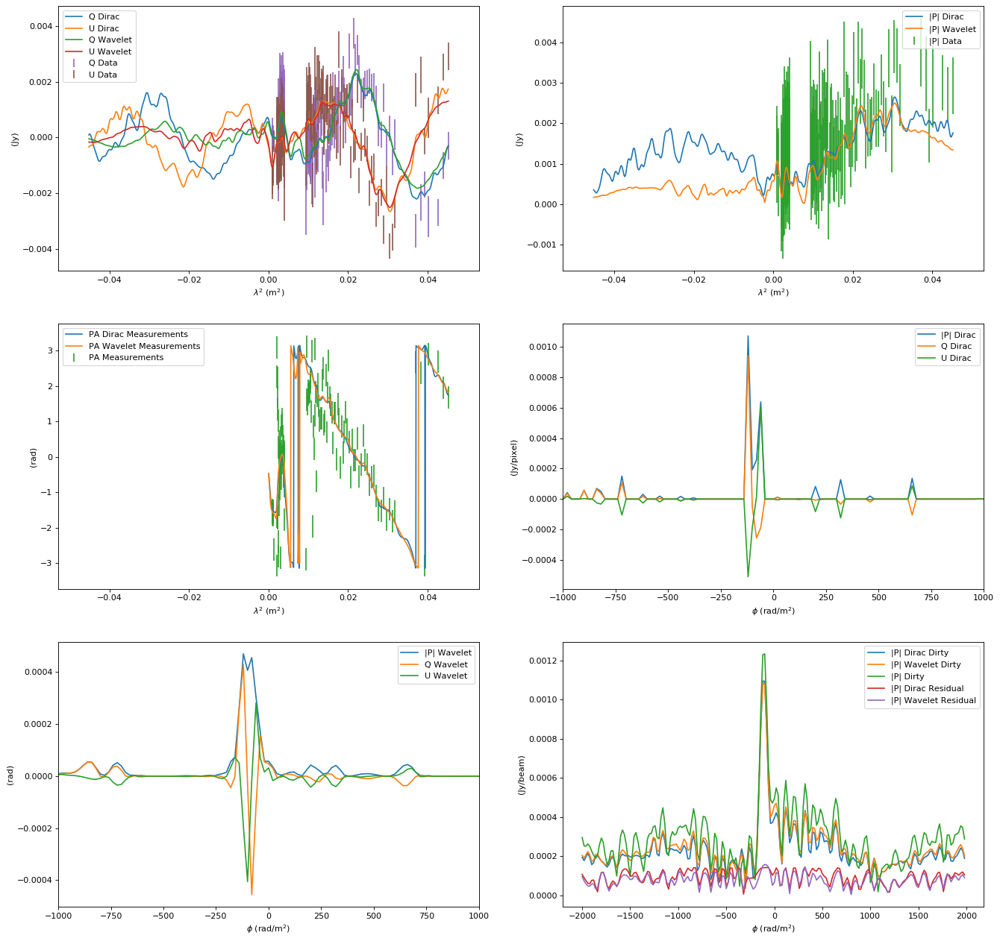

In [23]:
source = sources[17]
print(source)
wav = ["db8", "db6", "db4"]
levels = 1
sig_factor = 0.5
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_s1382'
78
2020-08-09 15:09:10,580 - Faraday Dreams - INFO - φ resolution 21.51911360597673 rad/m^2.
2020-08-09 15:09:10,580 - Faraday Dreams - INFO - φ max range is 8008.472198838518 rad/m^2.
2020-08-09 15:09:10,581 - Faraday Dreams - INFO - φ min range is 728.6384528358712 rad/m^2.
2020-08-09 15:09:10,593 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:09:10,594 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:09:10,595 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2020-08-09 15:09:10,597 - Optimus Primal - INFO - [Power Method] iter = 21, tol = 0.0
2020-08-09 15:09:10,598 - Optimus Primal - INFO - [Power Method] iter = 31, tol = 0.0
2020-08-09 15:09:10,599 - Optimus Primal - INFO - [Power Method] iter = 41, tol = 0.0
2020-08-09 15:09:10,601 - Optimus Primal - INFO - [Power Method] Converged with iter = 48, tol = 9.35534187643934e-05
2020-08-09 15:09:10,601 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2

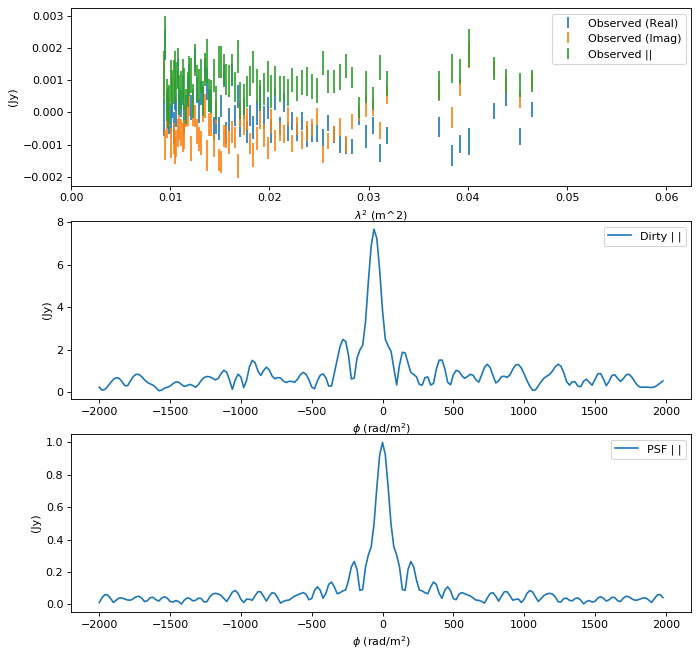

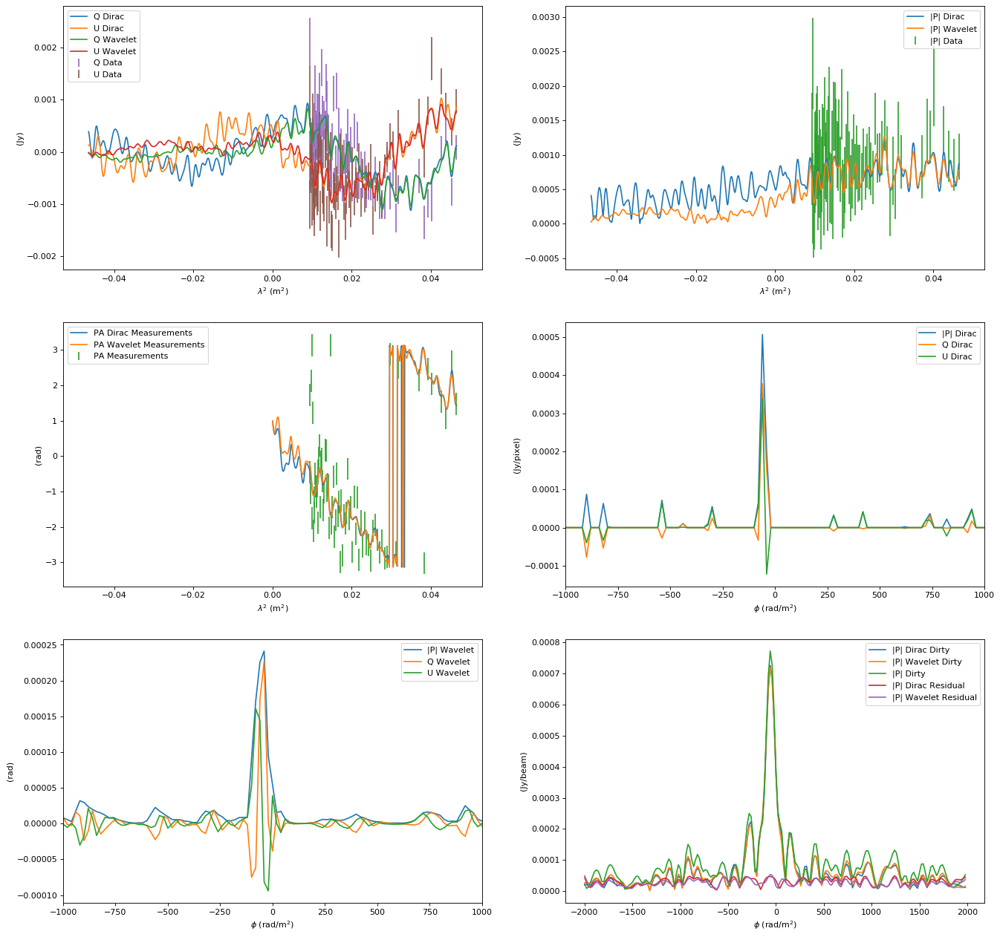

In [24]:
source = sources[18]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 0.8
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_s1437'
135
2020-08-09 15:09:18,615 - Faraday Dreams - INFO - φ resolution 21.02762685381873 rad/m^2.
2020-08-09 15:09:18,615 - Faraday Dreams - INFO - φ max range is 279401.08188832155 rad/m^2.
2020-08-09 15:09:18,616 - Faraday Dreams - INFO - φ min range is 703.8170852356799 rad/m^2.
2020-08-09 15:09:18,638 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:09:18,640 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:09:18,641 - Optimus Primal - INFO - [Power Method] Converged with iter = 8, tol = 6.699588923815592e-05
2020-08-09 15:09:18,642 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:09:18,642 - Faraday Dreams - INFO - Using an estimated noise level of 0.00011951258056797087 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:09:18,643 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2020-08-09 15:09:18,644 - Optimus Primal - INFO - Running Forward Backward Primal Du

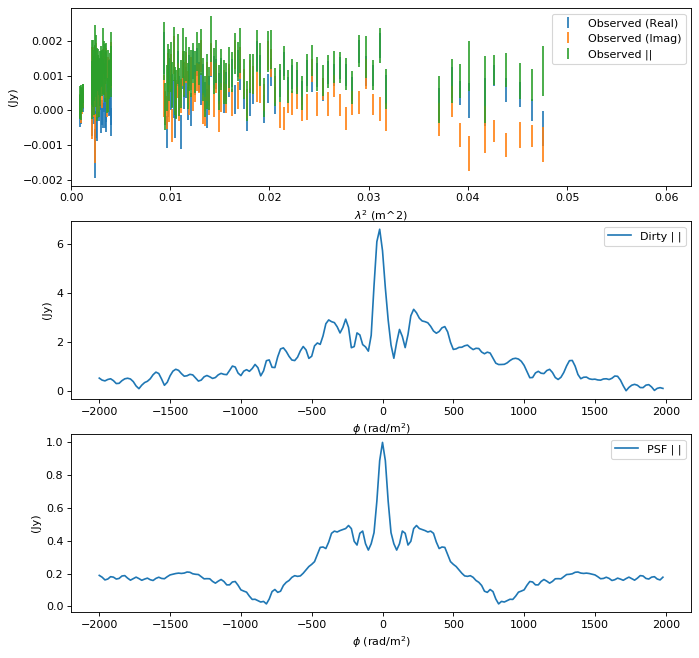

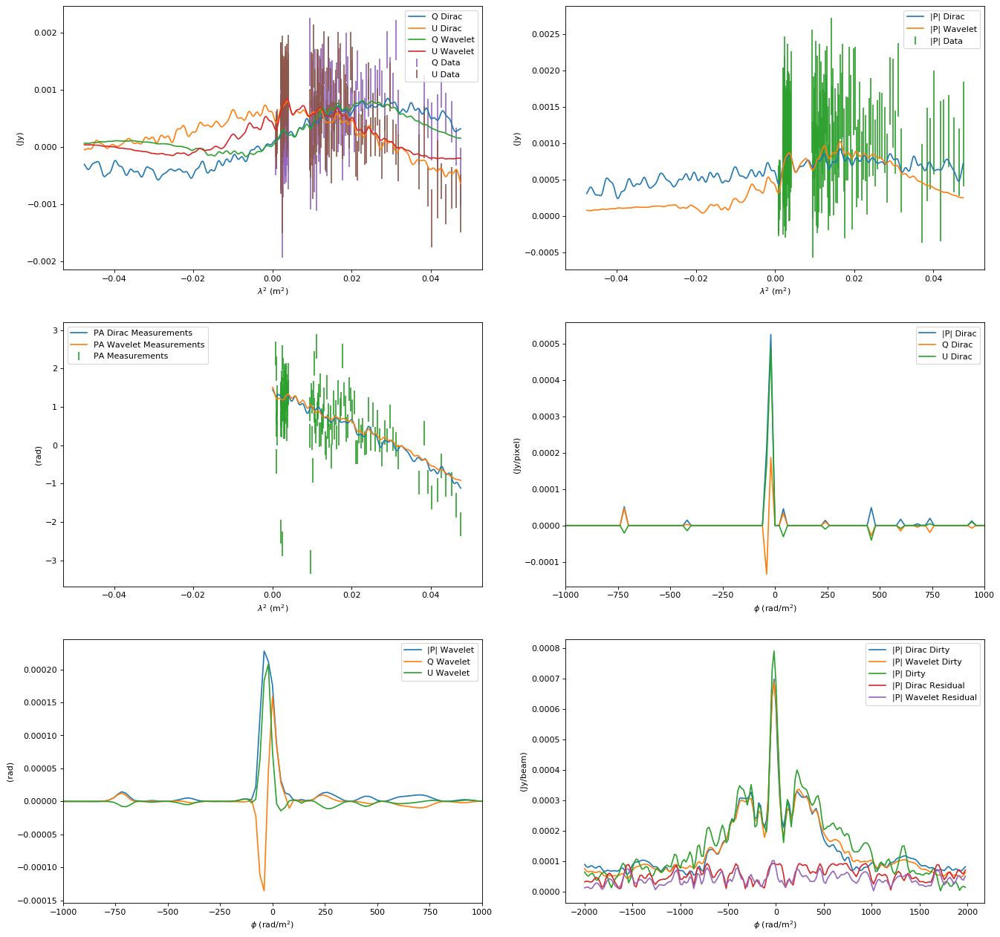

In [25]:
source = sources[19]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1.2
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_s1443'
127
2020-08-09 15:09:24,022 - Faraday Dreams - INFO - φ resolution 21.027658261974576 rad/m^2.
2020-08-09 15:09:24,023 - Faraday Dreams - INFO - φ max range is 77150.70572010738 rad/m^2.
2020-08-09 15:09:24,023 - Faraday Dreams - INFO - φ min range is 703.8186622502269 rad/m^2.
2020-08-09 15:09:24,041 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:09:24,043 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:09:24,044 - Optimus Primal - INFO - [Power Method] Converged with iter = 11, tol = 6.46366658018945e-05
2020-08-09 15:09:24,045 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:09:24,045 - Faraday Dreams - INFO - Using an estimated noise level of 8.084181899903342e-05 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:09:24,046 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2020-08-09 15:09:24,047 - Optimus Primal - INFO - Running Forward Backward Primal Dua

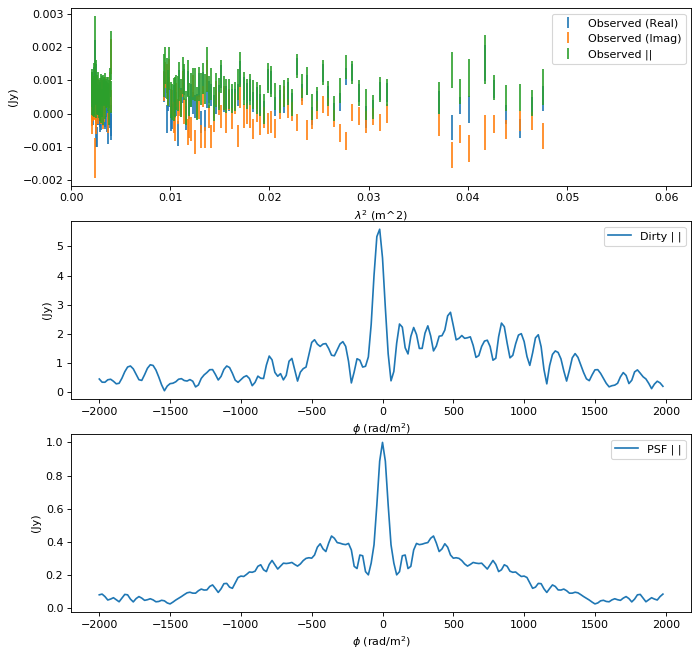

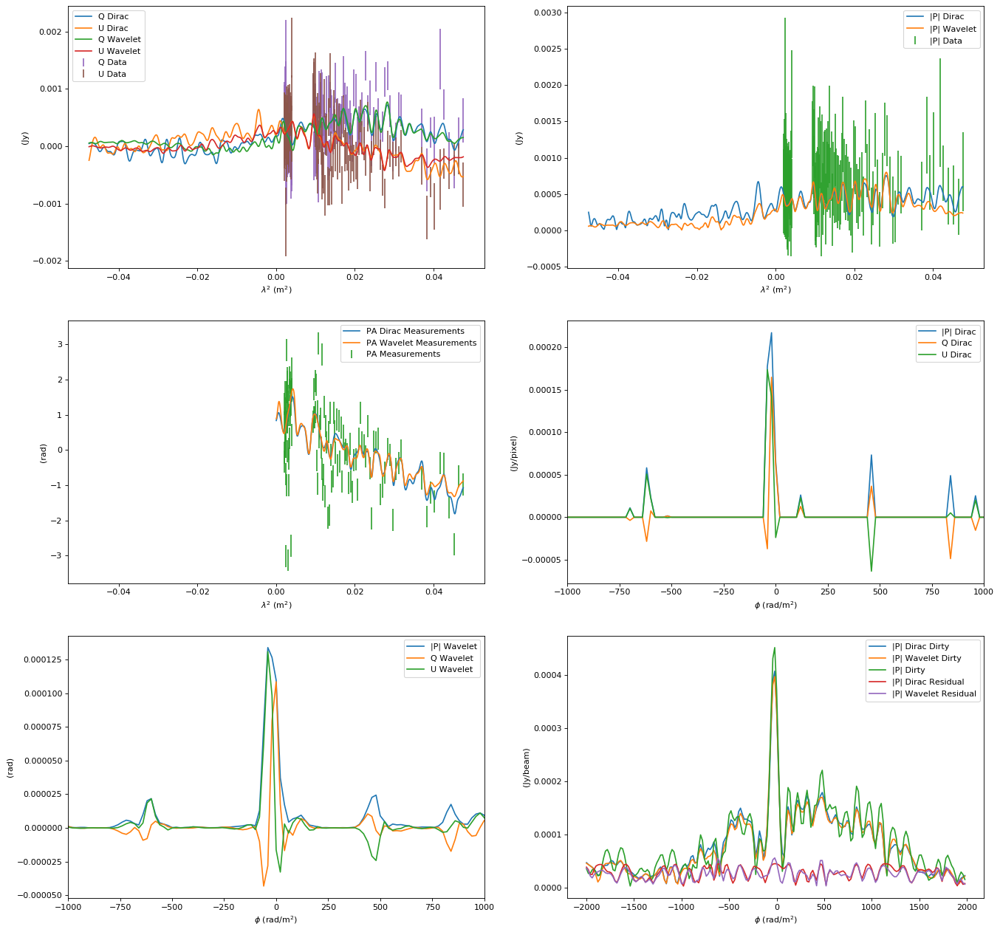

In [26]:
source = sources[20]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_s1568'
139
2020-08-09 15:09:28,792 - Faraday Dreams - INFO - φ resolution 19.8269825625 rad/m^2.
2020-08-09 15:09:28,793 - Faraday Dreams - INFO - φ max range is 279300.5829115088 rad/m^2.
2020-08-09 15:09:28,794 - Faraday Dreams - INFO - φ min range is 644.4013117536579 rad/m^2.
2020-08-09 15:09:28,817 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:09:28,818 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:09:28,819 - Optimus Primal - INFO - [Power Method] Converged with iter = 11, tol = 7.429179550107012e-05
2020-08-09 15:09:28,820 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:09:28,821 - Faraday Dreams - INFO - Using an estimated noise level of 0.00029783096397295594 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:09:28,821 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2020-08-09 15:09:28,823 - Optimus Primal - INFO - Running Forward Backward Primal Dual
2

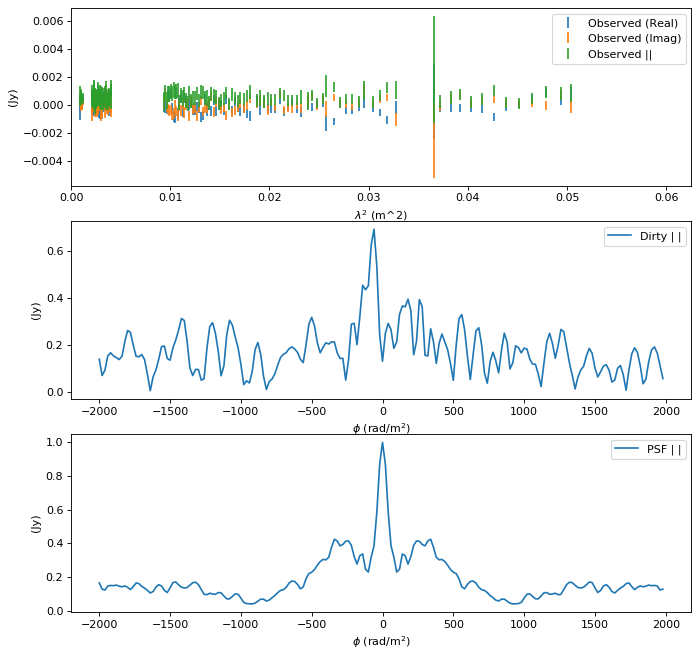

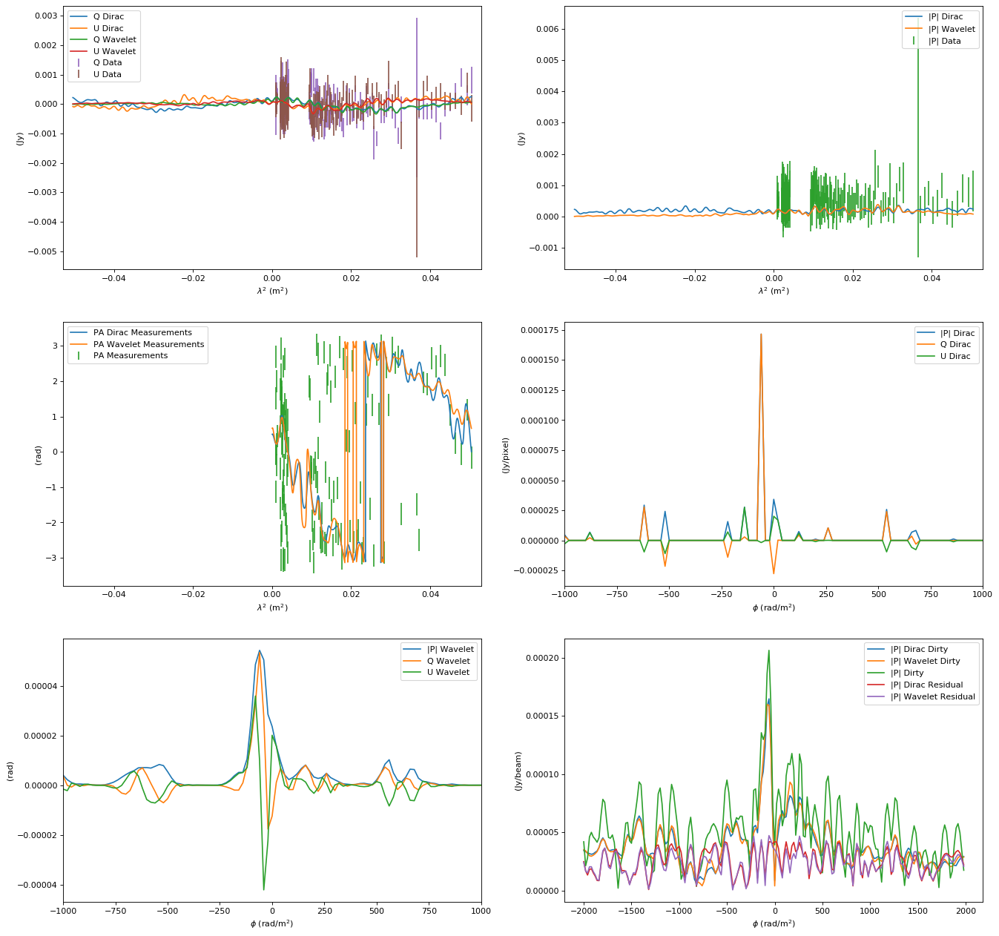

In [27]:
source = sources[21]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_s1605'
130
2020-08-09 15:09:32,345 - Faraday Dreams - INFO - φ resolution 19.83408930024395 rad/m^2.
2020-08-09 15:09:32,346 - Faraday Dreams - INFO - φ max range is 77166.77994969844 rad/m^2.
2020-08-09 15:09:32,347 - Faraday Dreams - INFO - φ min range is 644.7478367033619 rad/m^2.
2020-08-09 15:09:32,367 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:09:32,368 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:09:32,369 - Optimus Primal - INFO - [Power Method] Converged with iter = 8, tol = 6.855469968205342e-05
2020-08-09 15:09:32,370 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:09:32,370 - Faraday Dreams - INFO - Using an estimated noise level of 0.0003159504267387092 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:09:32,371 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2020-08-09 15:09:32,372 - Optimus Primal - INFO - Running Forward Backward Primal Dual

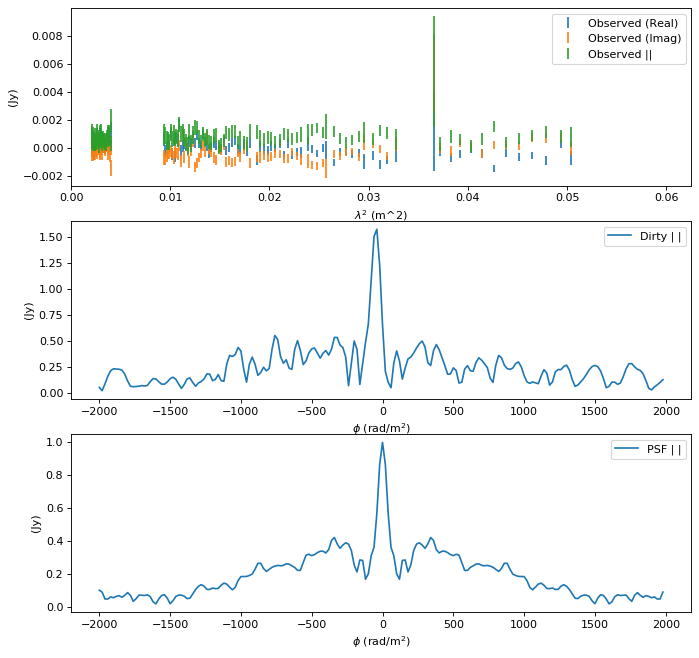

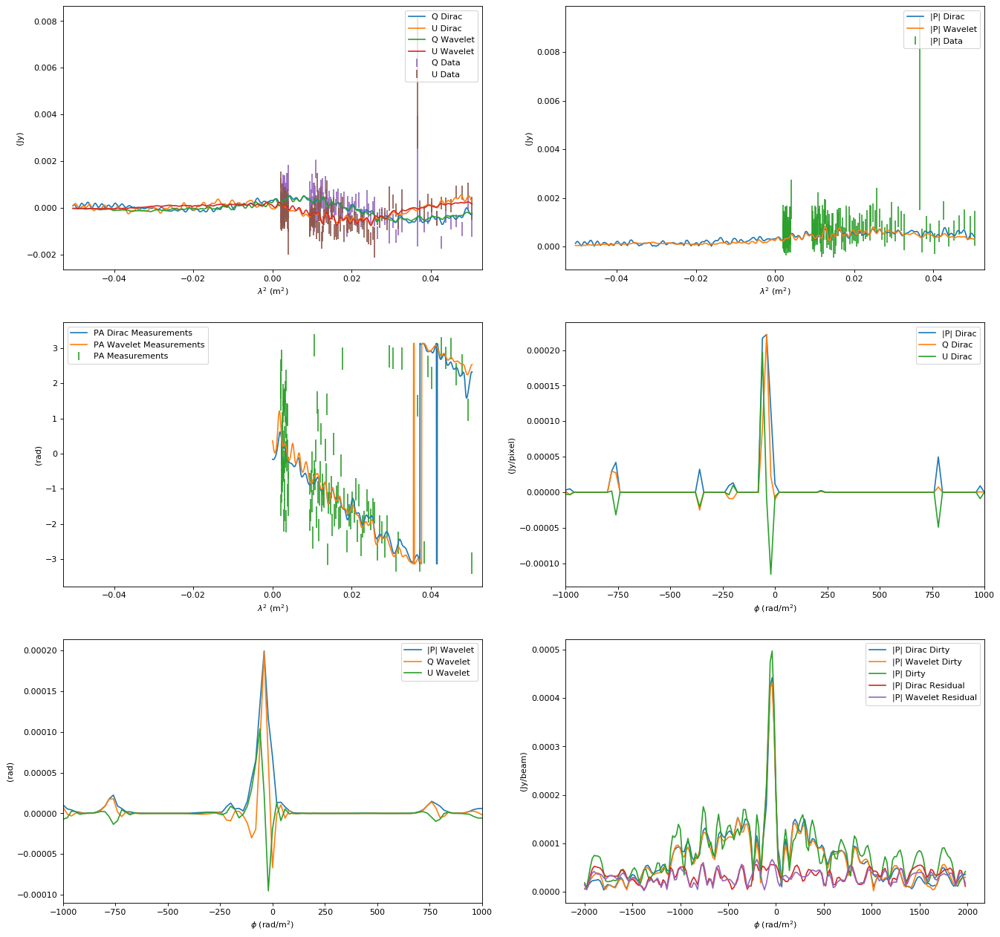

In [28]:
source = sources[22]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_s1681'
119
2020-08-09 15:09:35,486 - Faraday Dreams - INFO - φ resolution 20.890659849127417 rad/m^2.
2020-08-09 15:09:35,487 - Faraday Dreams - INFO - φ max range is 73156.59542259363 rad/m^2.
2020-08-09 15:09:35,487 - Faraday Dreams - INFO - φ min range is 696.9511382443034 rad/m^2.
2020-08-09 15:09:35,505 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:09:35,506 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:09:35,507 - Optimus Primal - INFO - [Power Method] Converged with iter = 11, tol = 8.874687257501992e-05
2020-08-09 15:09:35,507 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:09:35,508 - Faraday Dreams - INFO - Using an estimated noise level of 0.00010935687168966979 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:09:35,508 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2020-08-09 15:09:35,509 - Optimus Primal - INFO - Running Forward Backward Primal D

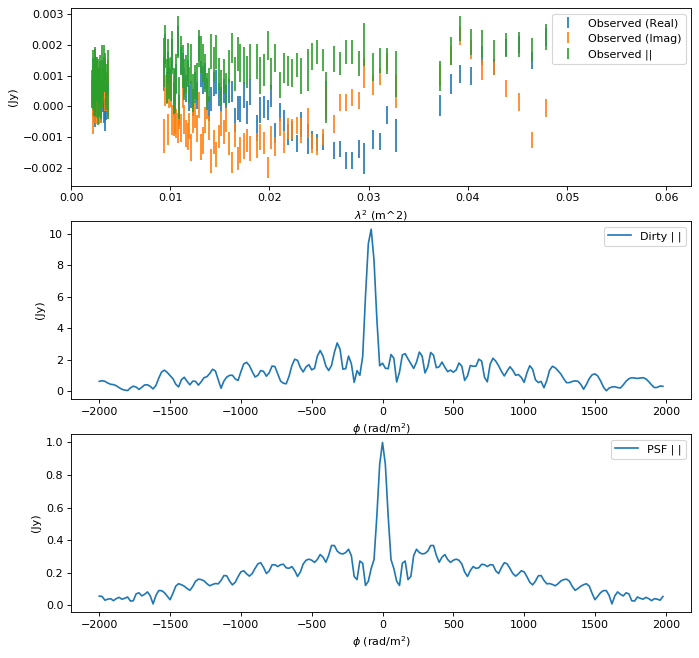

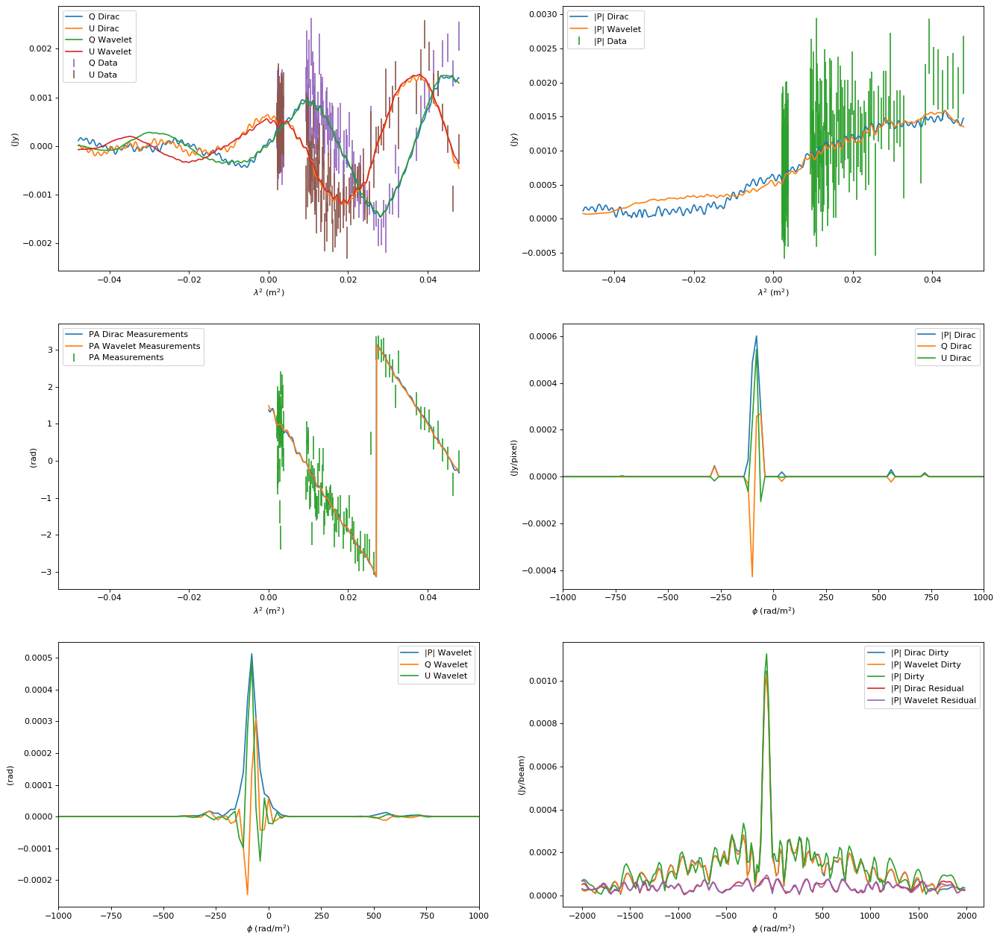

In [29]:
source = sources[23]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-4, 1e-4
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_s1803'
129
2020-08-09 15:09:48,504 - Faraday Dreams - INFO - φ resolution 25.497554006954868 rad/m^2.
2020-08-09 15:09:48,505 - Faraday Dreams - INFO - φ max range is 279400.14492215076 rad/m^2.
2020-08-09 15:09:48,506 - Faraday Dreams - INFO - φ min range is 939.7897124823794 rad/m^2.
2020-08-09 15:09:48,525 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:09:48,526 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:09:48,527 - Optimus Primal - INFO - [Power Method] Converged with iter = 5, tol = 2.0521011028481035e-05
2020-08-09 15:09:48,528 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:09:48,529 - Faraday Dreams - INFO - Using an estimated noise level of 0.00025035356520675123 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:09:48,530 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2020-08-09 15:09:48,530 - Optimus Primal - INFO - Running Forward Backward Primal 

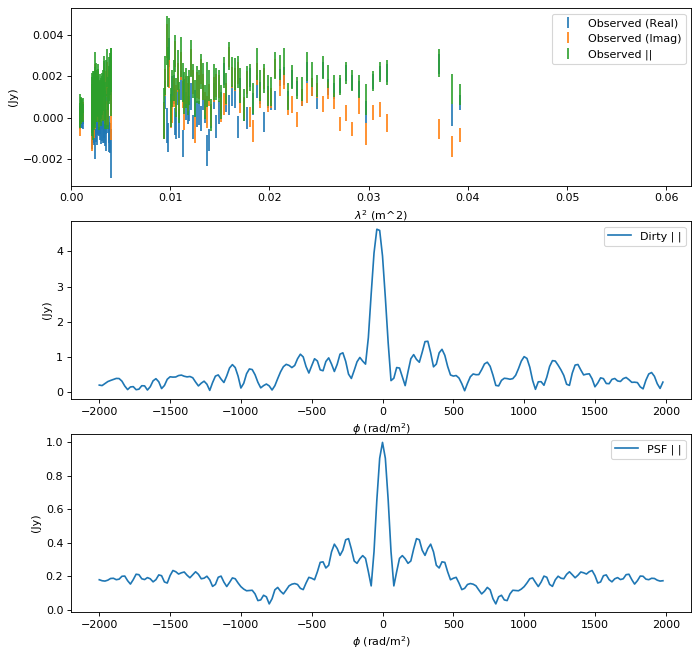

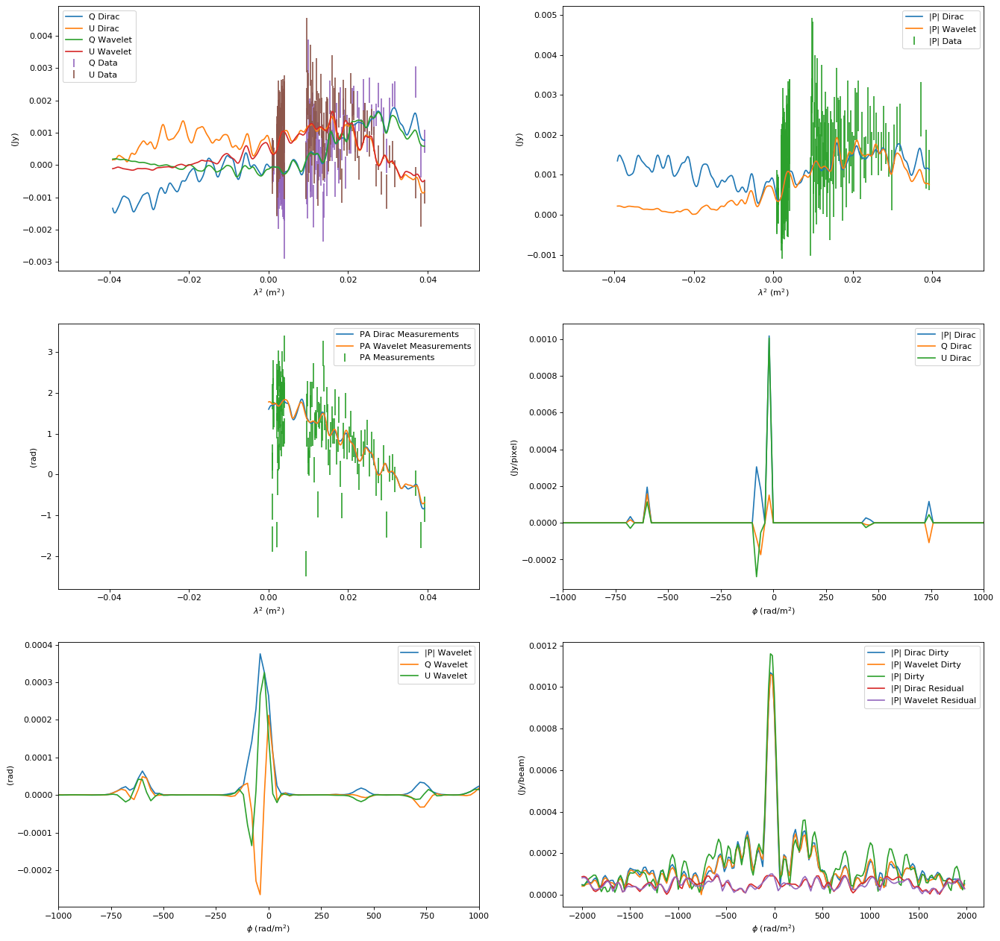

In [30]:
source = sources[24]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 0.5
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'lmc_c01'
136
2020-08-09 15:09:55,845 - Faraday Dreams - INFO - φ resolution 21.071369715894164 rad/m^2.
2020-08-09 15:09:55,846 - Faraday Dreams - INFO - φ max range is 279460.7113164403 rad/m^2.
2020-08-09 15:09:55,847 - Faraday Dreams - INFO - φ min range is 706.0145708300956 rad/m^2.
2020-08-09 15:09:55,870 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:09:55,871 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:09:55,872 - Optimus Primal - INFO - [Power Method] Converged with iter = 4, tol = 2.3000774315351848e-05
2020-08-09 15:09:55,873 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:09:55,873 - Faraday Dreams - INFO - Using an estimated noise level of 0.00012347025040071458 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:09:55,874 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2020-08-09 15:09:55,875 - Optimus Primal - INFO - Running Forward Backward Primal Dual

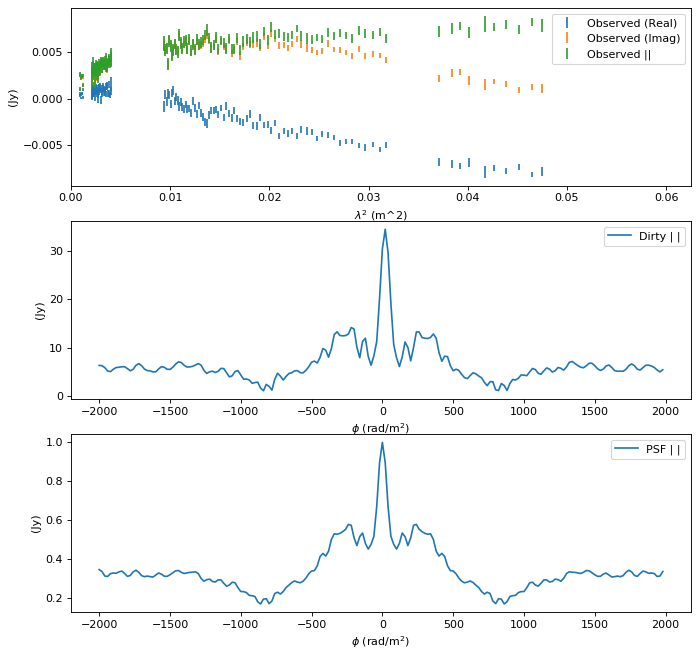

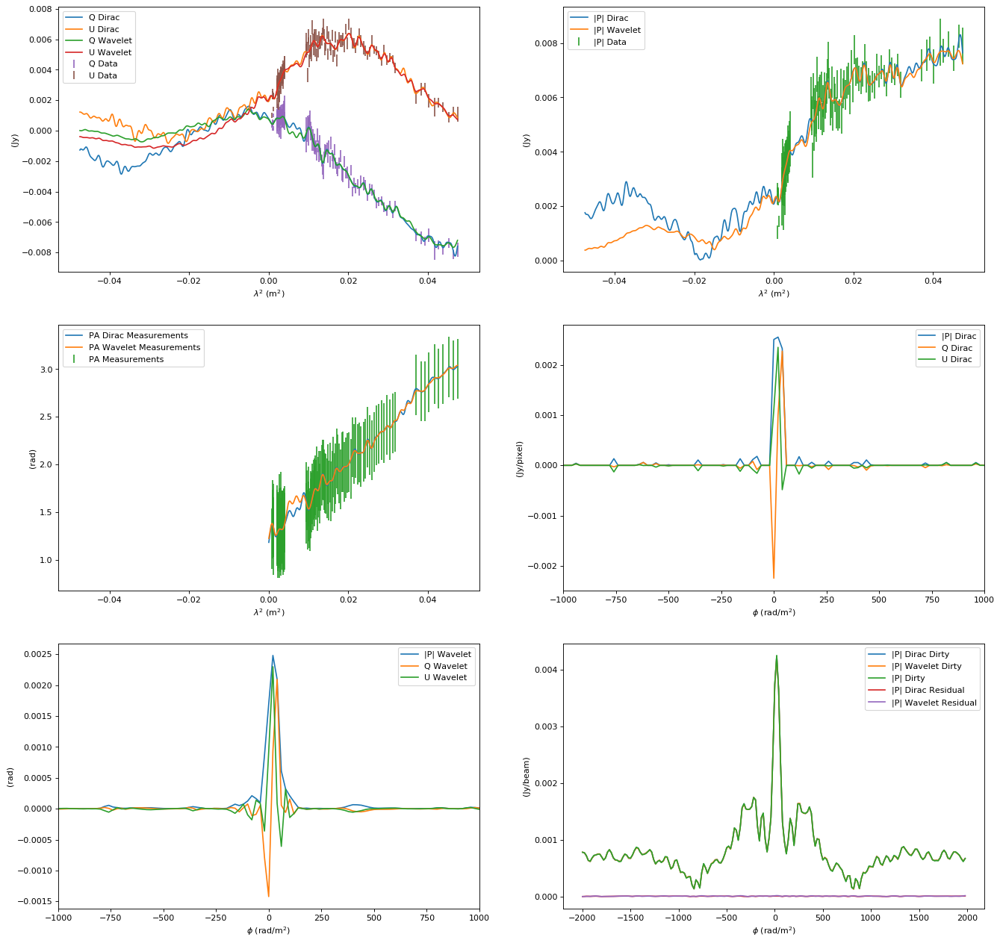

In [31]:
source = sources[25]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'lmc_c02'
135
2020-08-09 15:09:59,755 - Faraday Dreams - INFO - φ resolution 21.060209711496064 rad/m^2.
2020-08-09 15:09:59,756 - Faraday Dreams - INFO - φ max range is 279324.1724555046 rad/m^2.
2020-08-09 15:09:59,757 - Faraday Dreams - INFO - φ min range is 705.4537150038055 rad/m^2.
2020-08-09 15:09:59,776 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:09:59,778 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:09:59,779 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2020-08-09 15:09:59,780 - Optimus Primal - INFO - [Power Method] iter = 21, tol = 0.0
2020-08-09 15:09:59,781 - Optimus Primal - INFO - [Power Method] Converged with iter = 23, tol = 7.964342335209856e-05
2020-08-09 15:09:59,782 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:09:59,782 - Faraday Dreams - INFO - Using an estimated noise level of 0.00015441694995388389 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:09:59,783 - Far

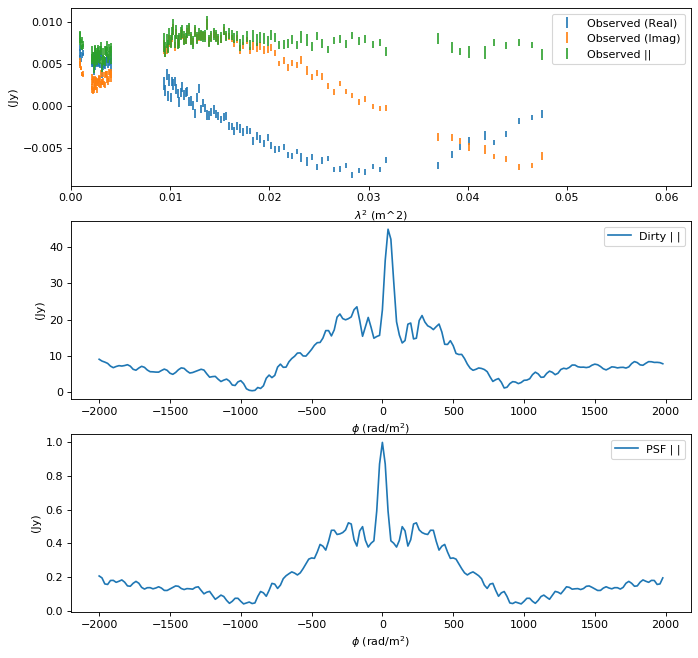

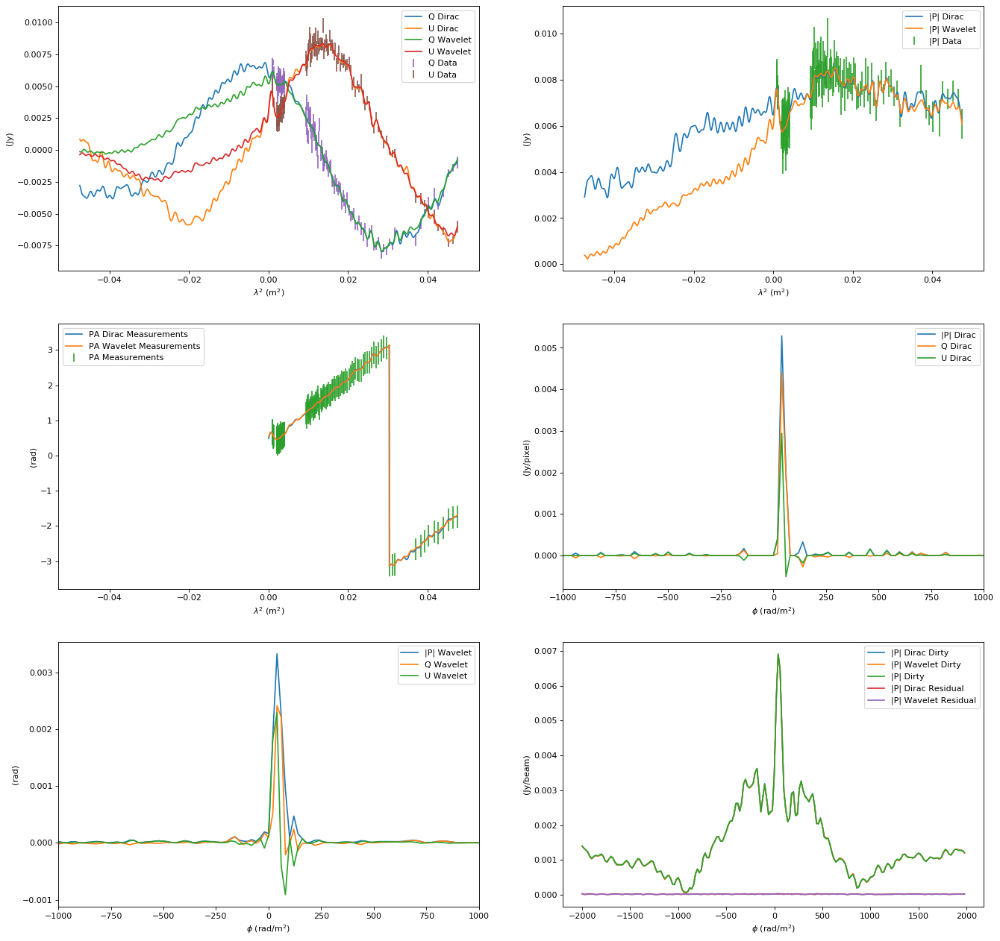

In [32]:
source = sources[26]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'lmc_c03'
135
2020-08-09 15:10:03,562 - Faraday Dreams - INFO - φ resolution 21.5180015625 rad/m^2.
2020-08-09 15:10:03,563 - Faraday Dreams - INFO - φ max range is 279403.21136468835 rad/m^2.
2020-08-09 15:10:03,564 - Faraday Dreams - INFO - φ min range is 728.5819686747205 rad/m^2.
2020-08-09 15:10:03,584 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:10:03,585 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:10:03,586 - Optimus Primal - INFO - [Power Method] Converged with iter = 6, tol = 4.070245815283477e-05
2020-08-09 15:10:03,587 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:10:03,588 - Faraday Dreams - INFO - Using an estimated noise level of 0.00021976992138661444 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:10:03,589 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2020-08-09 15:10:03,590 - Optimus Primal - INFO - Running Forward Backward Primal Dual
2020

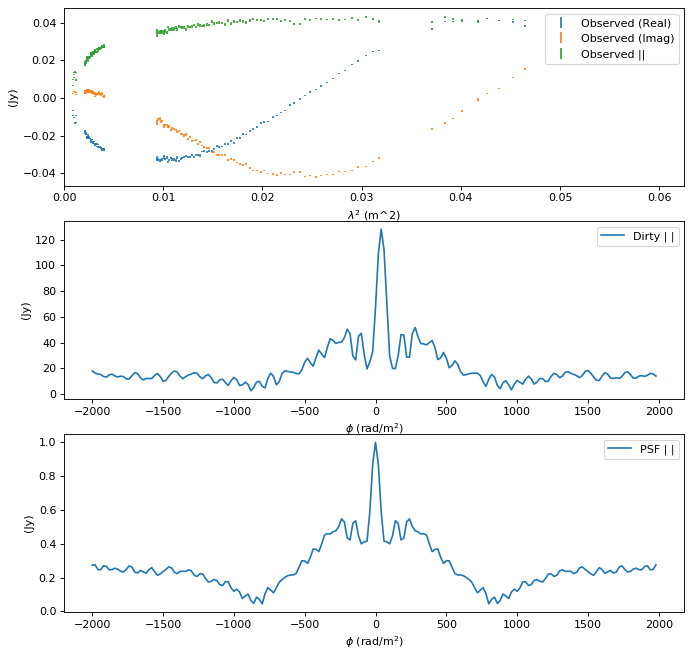

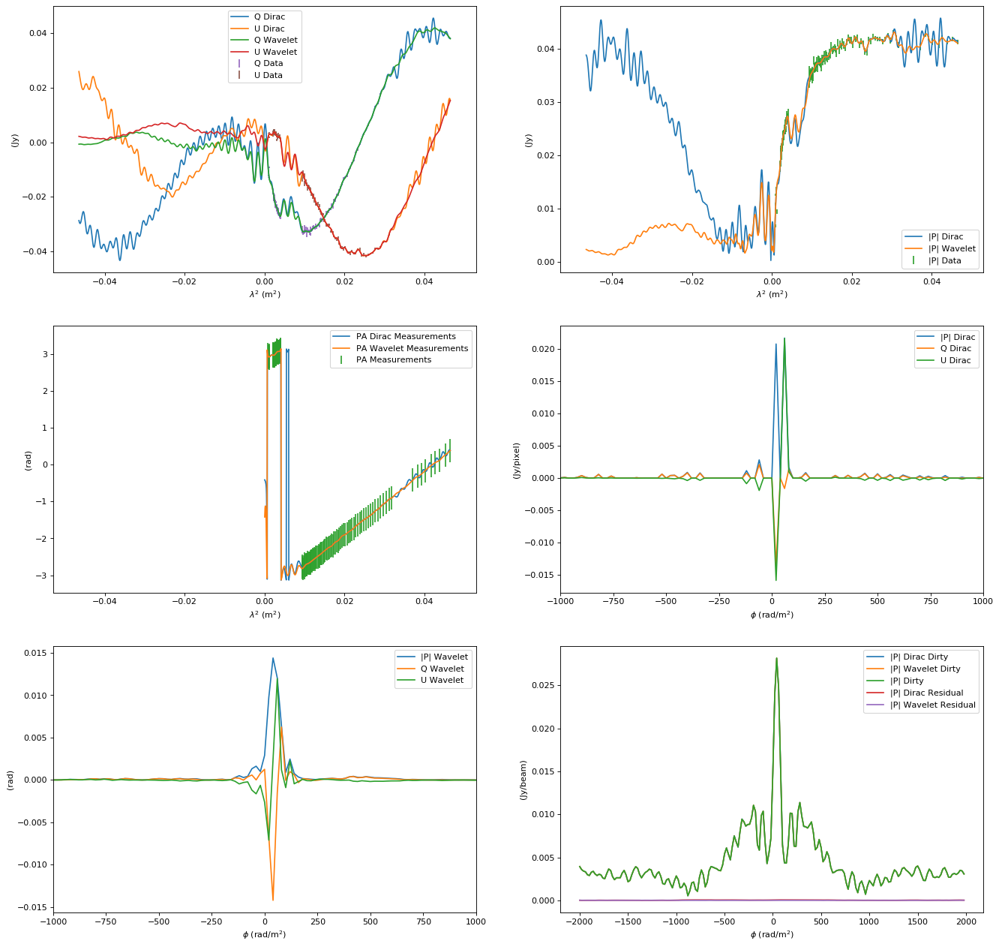

In [33]:
source = sources[27]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'lmc_c04'
225
2020-08-09 15:10:15,429 - Faraday Dreams - INFO - φ resolution 20.87112966785513 rad/m^2.
2020-08-09 15:10:15,430 - Faraday Dreams - INFO - φ max range is 265461.2006448128 rad/m^2.
2020-08-09 15:10:15,431 - Faraday Dreams - INFO - φ min range is 695.9739489984812 rad/m^2.
2020-08-09 15:10:15,466 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:10:15,469 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:10:15,470 - Optimus Primal - INFO - [Power Method] Converged with iter = 9, tol = 6.737546455186435e-05
2020-08-09 15:10:15,471 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:10:15,471 - Faraday Dreams - INFO - Using an estimated noise level of 0.00025056363665498793 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:10:15,472 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2020-08-09 15:10:15,472 - Optimus Primal - INFO - Running Forward Backward Primal Dual
2

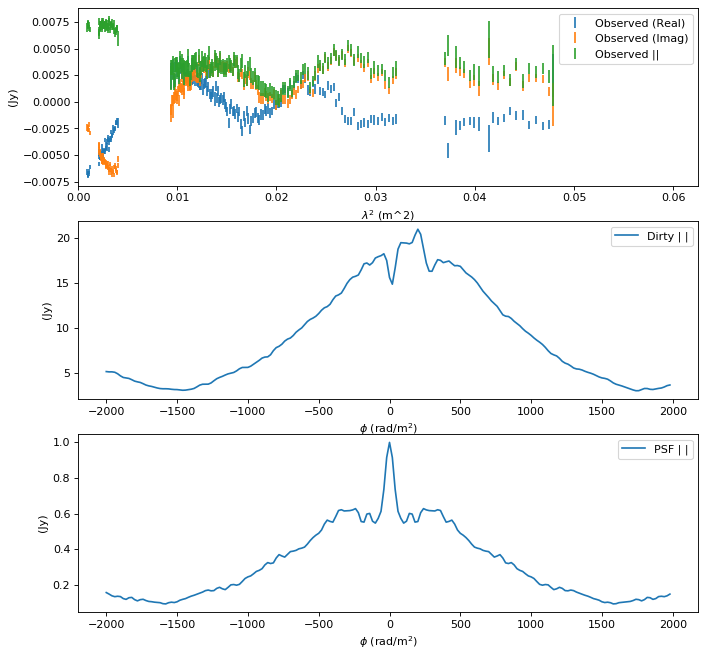

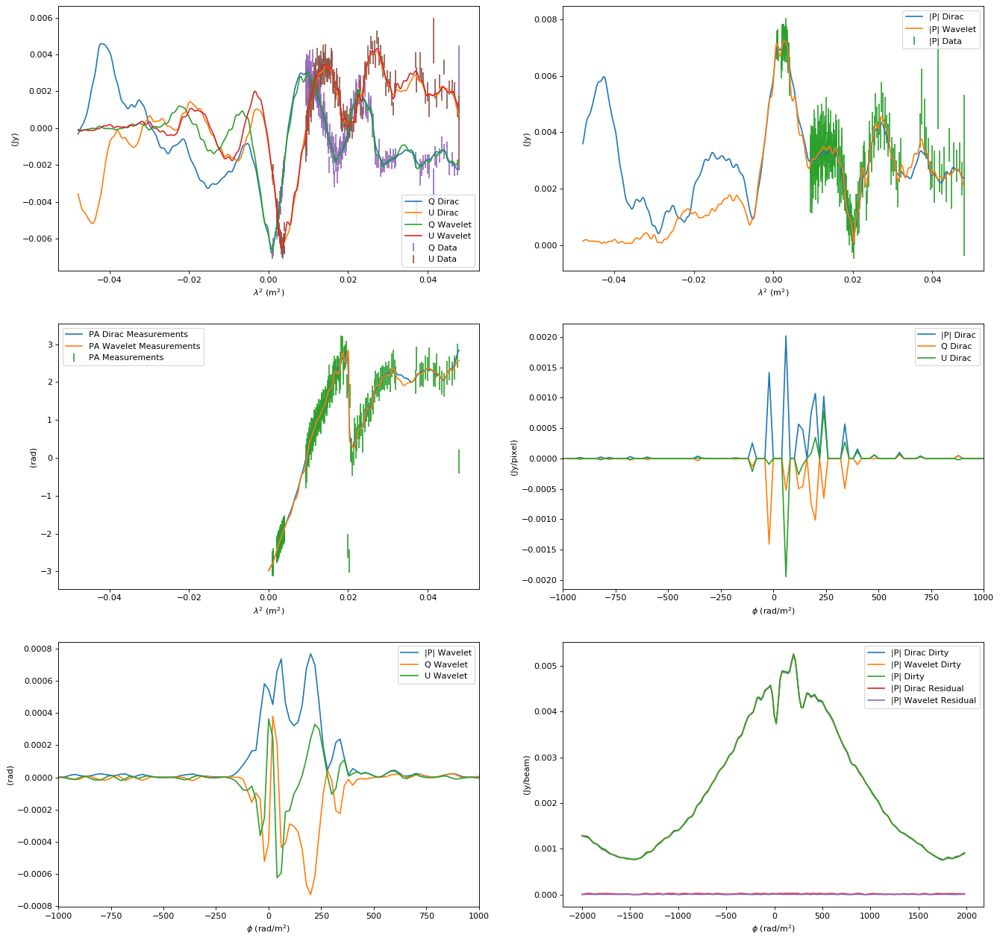

In [34]:
source = sources[28]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
beta1, beta2 = 1e-3, 1e-4
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'lmc_c06'
129
2020-08-09 15:10:20,556 - Faraday Dreams - INFO - φ resolution 20.87112966785513 rad/m^2.
2020-08-09 15:10:20,557 - Faraday Dreams - INFO - φ max range is 77145.36017890052 rad/m^2.
2020-08-09 15:10:20,557 - Faraday Dreams - INFO - φ min range is 695.9739489984812 rad/m^2.
2020-08-09 15:10:20,576 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:10:20,577 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:10:20,578 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2020-08-09 15:10:20,579 - Optimus Primal - INFO - [Power Method] Converged with iter = 20, tol = 8.609015407134077e-05
2020-08-09 15:10:20,580 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:10:20,580 - Faraday Dreams - INFO - Using an estimated noise level of 0.0002332130097784102 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:10:20,581 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
20

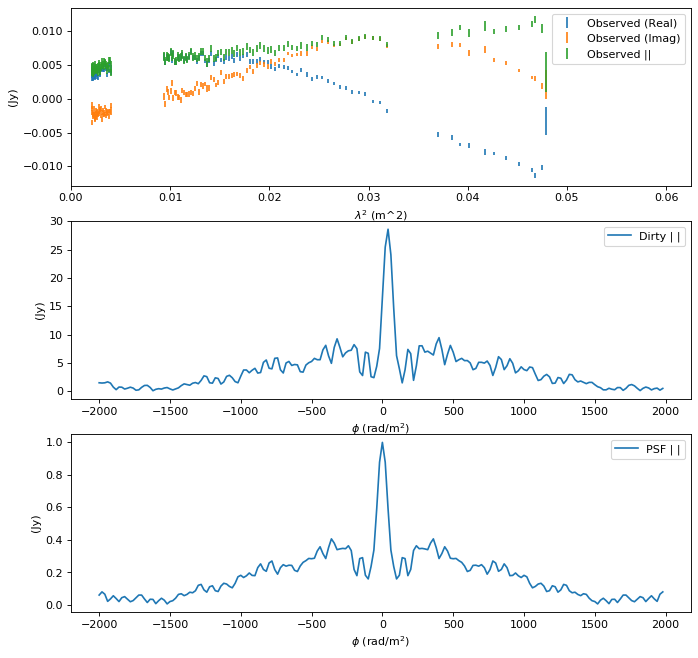

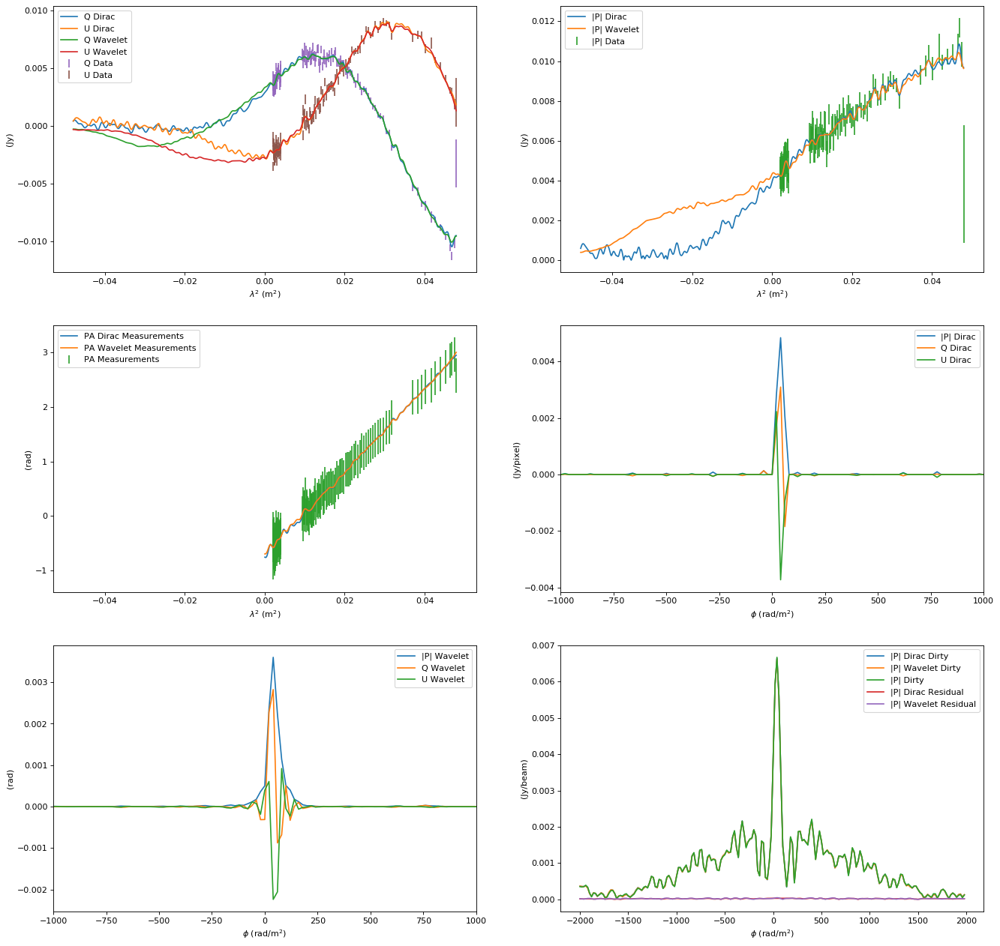

In [35]:
source = sources[29]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'lmc_c07'
135
2020-08-09 15:10:23,465 - Faraday Dreams - INFO - φ resolution 21.062378607665604 rad/m^2.
2020-08-09 15:10:23,466 - Faraday Dreams - INFO - φ max range is 279508.6765690141 rad/m^2.
2020-08-09 15:10:23,466 - Faraday Dreams - INFO - φ min range is 705.5627031546534 rad/m^2.
2020-08-09 15:10:23,489 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:10:23,490 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:10:23,491 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2020-08-09 15:10:23,492 - Optimus Primal - INFO - [Power Method] Converged with iter = 13, tol = 9.290587230933713e-05
2020-08-09 15:10:23,493 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:10:23,493 - Faraday Dreams - INFO - Using an estimated noise level of 0.00012698714854195715 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:10:23,494 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization


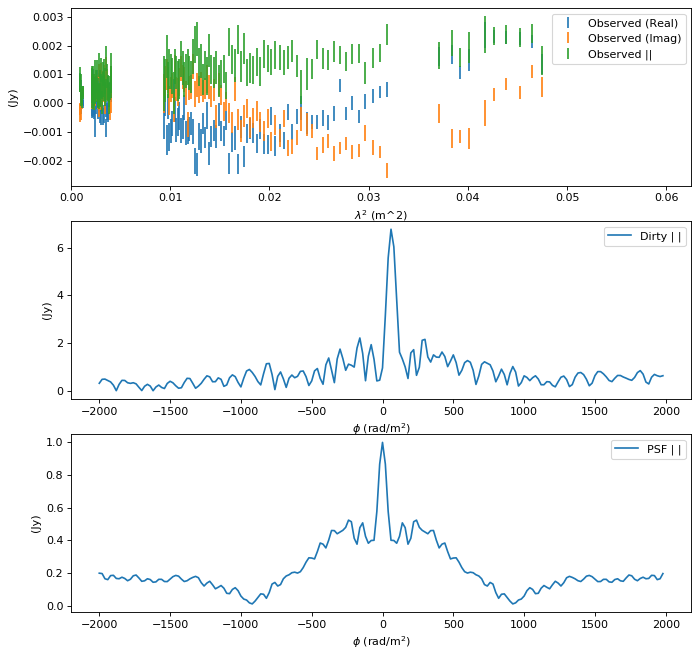

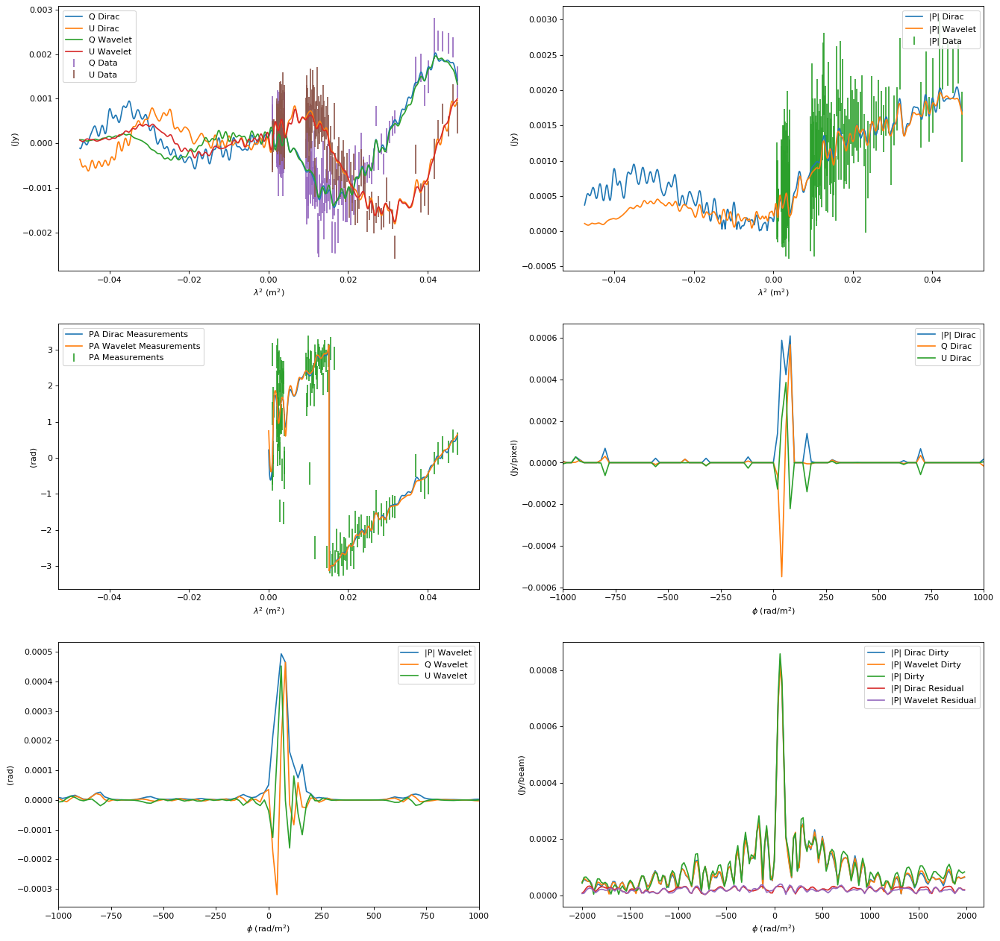

In [36]:
source = sources[30]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 0.8
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'lmc_c15'
136
2020-08-09 15:10:29,017 - Faraday Dreams - INFO - φ resolution 21.05379797599221 rad/m^2.
2020-08-09 15:10:29,018 - Faraday Dreams - INFO - φ max range is 279409.9405810959 rad/m^2.
2020-08-09 15:10:29,019 - Faraday Dreams - INFO - φ min range is 705.1315548094176 rad/m^2.
2020-08-09 15:10:29,039 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:10:29,040 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:10:29,041 - Optimus Primal - INFO - [Power Method] Converged with iter = 3, tol = 7.569044820150486e-05
2020-08-09 15:10:29,042 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:10:29,042 - Faraday Dreams - INFO - Using an estimated noise level of 0.00023795454762876034 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:10:29,043 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2020-08-09 15:10:29,044 - Optimus Primal - INFO - Running Forward Backward Primal Dual
2

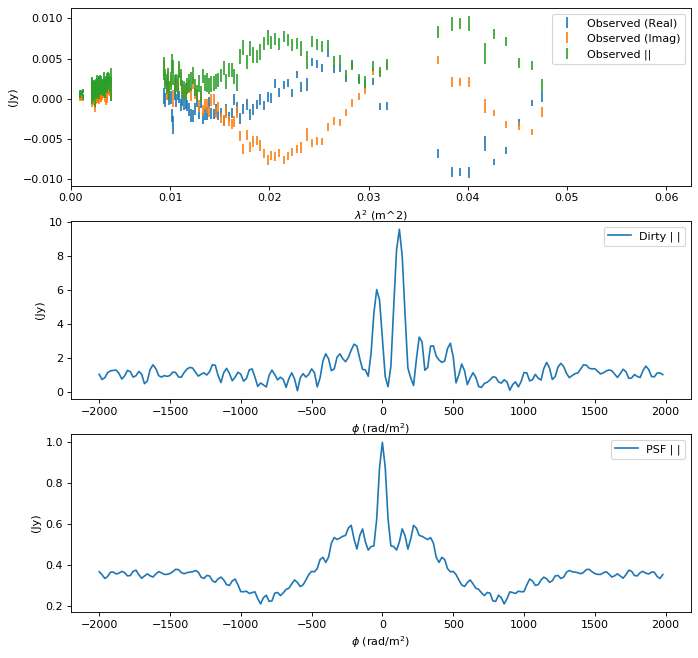

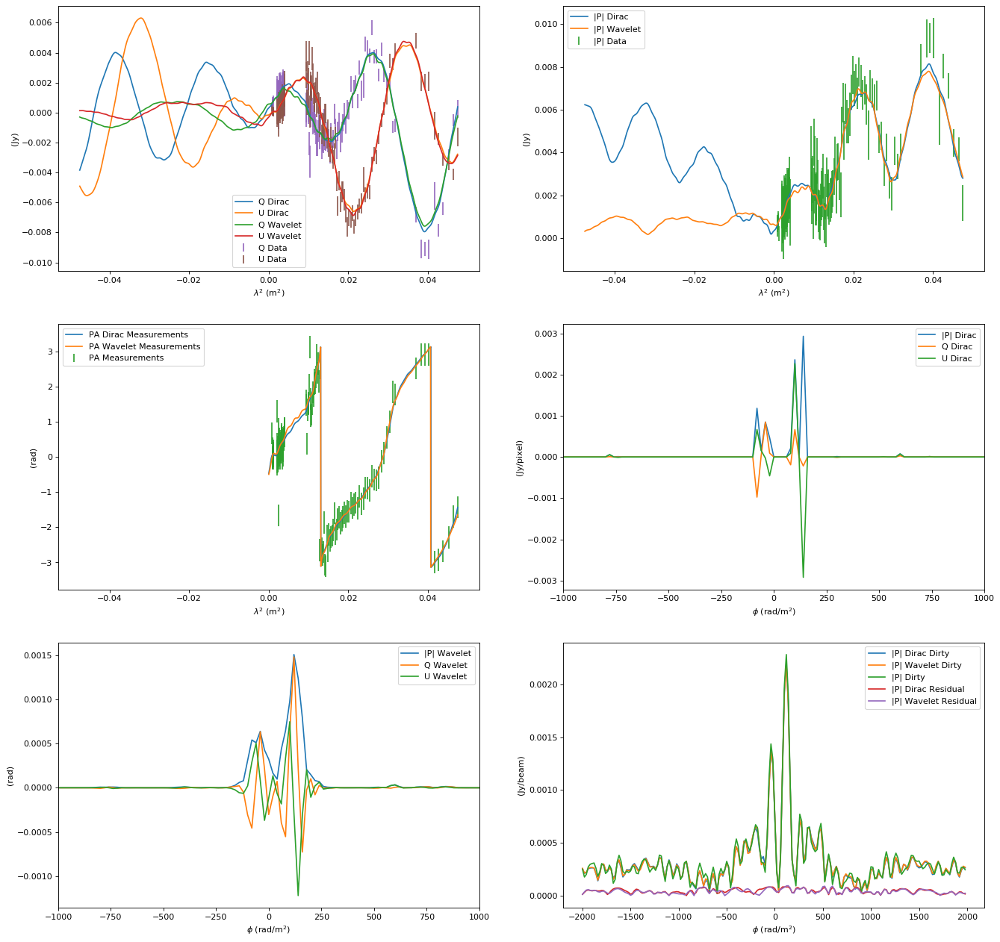

In [37]:
source = sources[31]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 0.6
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'lmc_c16'
131
2020-08-09 15:10:36,840 - Faraday Dreams - INFO - φ resolution 21.517556753154906 rad/m^2.
2020-08-09 15:10:36,841 - Faraday Dreams - INFO - φ max range is 279497.1746316958 rad/m^2.
2020-08-09 15:10:36,843 - Faraday Dreams - INFO - φ min range is 728.5593758276074 rad/m^2.
2020-08-09 15:10:36,875 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:10:36,876 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:10:36,878 - Optimus Primal - INFO - [Power Method] Converged with iter = 4, tol = 6.071491583906674e-05
2020-08-09 15:10:36,879 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:10:36,880 - Faraday Dreams - INFO - Using an estimated noise level of 0.00019796362903434783 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:10:36,881 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2020-08-09 15:10:36,882 - Optimus Primal - INFO - Running Forward Backward Primal Dual


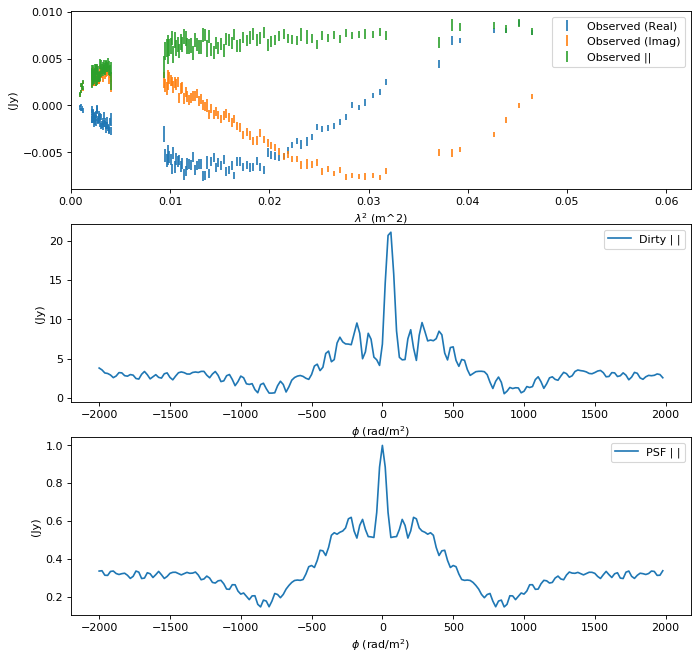

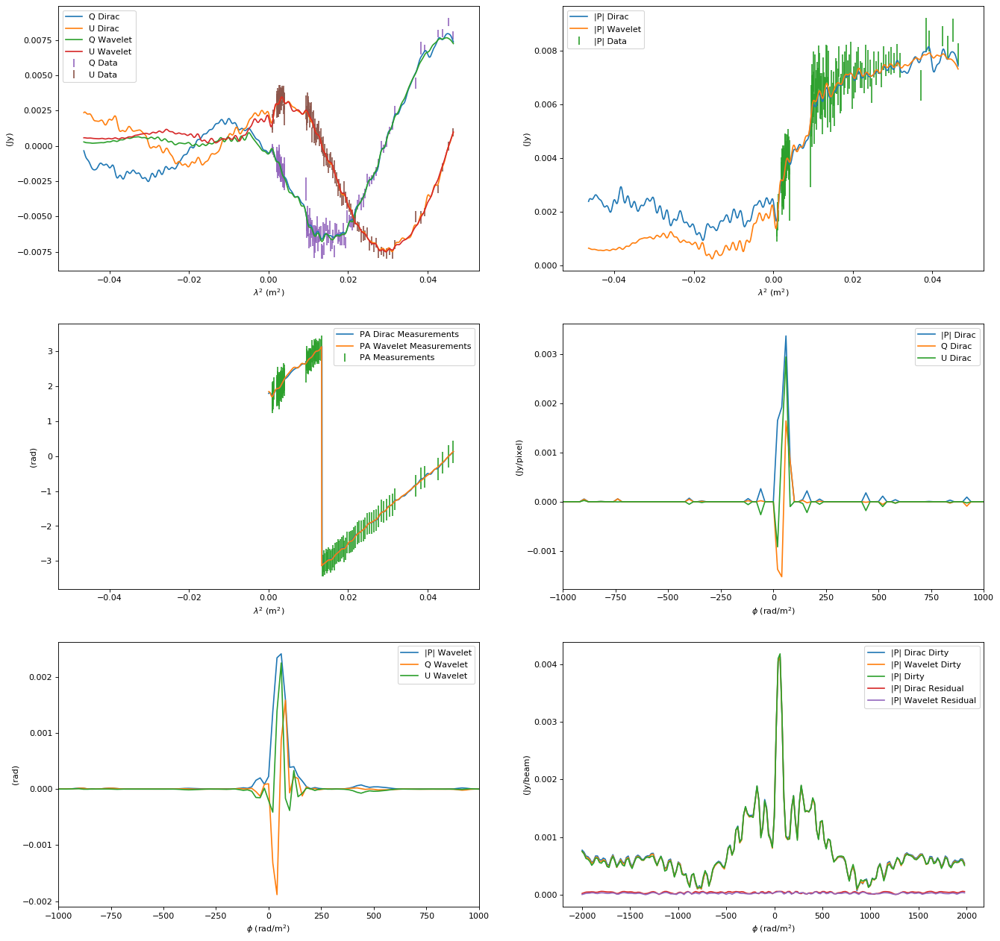

In [38]:
source = sources[32]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'lmc_s11'
172
2020-08-09 15:10:43,105 - Faraday Dreams - INFO - φ resolution 21.06099553054044 rad/m^2.
2020-08-09 15:10:43,107 - Faraday Dreams - INFO - φ max range is 279335.15865312505 rad/m^2.
2020-08-09 15:10:43,110 - Faraday Dreams - INFO - φ min range is 705.4932021676364 rad/m^2.
2020-08-09 15:10:43,149 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:10:43,151 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:10:43,156 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2020-08-09 15:10:43,159 - Optimus Primal - INFO - [Power Method] iter = 21, tol = 0.0
2020-08-09 15:10:43,164 - Optimus Primal - INFO - [Power Method] iter = 31, tol = 0.0
2020-08-09 15:10:43,165 - Optimus Primal - INFO - [Power Method] Converged with iter = 33, tol = 9.55848132789885e-05
2020-08-09 15:10:43,166 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:10:43,166 - Faraday Dreams - INFO - Using an estimated noise level of 0.00

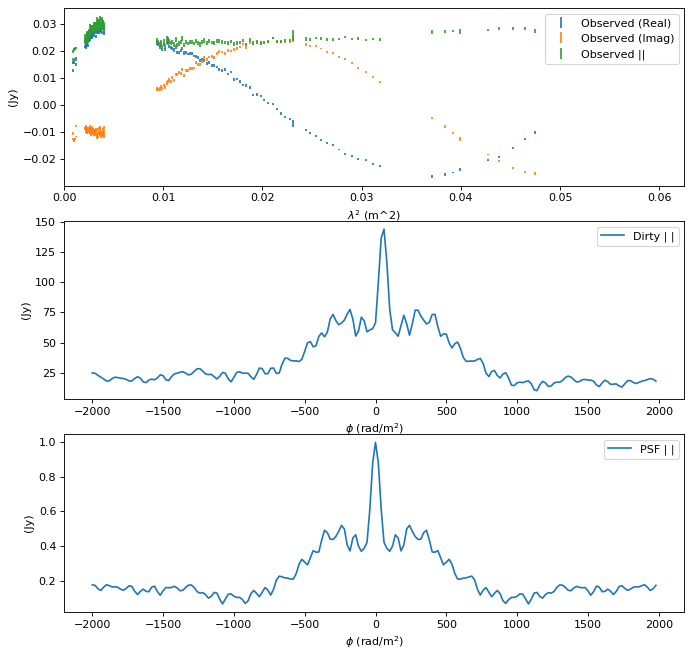

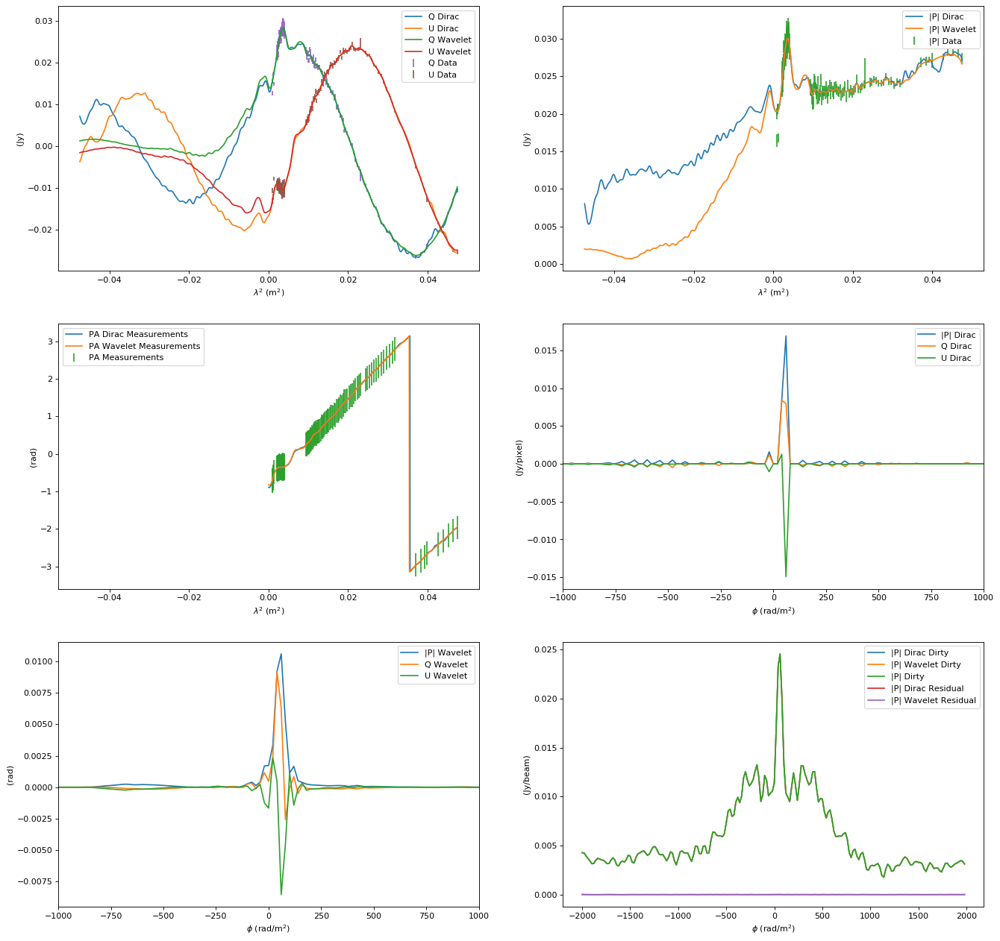

In [39]:
source = sources[33]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'lmc_s13'
176
2020-08-09 15:10:47,846 - Faraday Dreams - INFO - φ resolution 21.083601960135578 rad/m^2.
2020-08-09 15:10:47,847 - Faraday Dreams - INFO - φ max range is 279335.07348770136 rad/m^2.
2020-08-09 15:10:47,847 - Faraday Dreams - INFO - φ min range is 706.6294836586471 rad/m^2.
2020-08-09 15:10:47,874 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:10:47,876 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:10:47,877 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2020-08-09 15:10:47,879 - Optimus Primal - INFO - [Power Method] iter = 21, tol = 0.0
2020-08-09 15:10:47,880 - Optimus Primal - INFO - [Power Method] iter = 31, tol = 0.0
2020-08-09 15:10:47,882 - Optimus Primal - INFO - [Power Method] iter = 41, tol = 0.0
2020-08-09 15:10:47,883 - Optimus Primal - INFO - [Power Method] iter = 51, tol = 0.0
2020-08-09 15:10:47,884 - Optimus Primal - INFO - [Power Method] Converged with iter = 56, tol = 9.812028791593742e-05
202

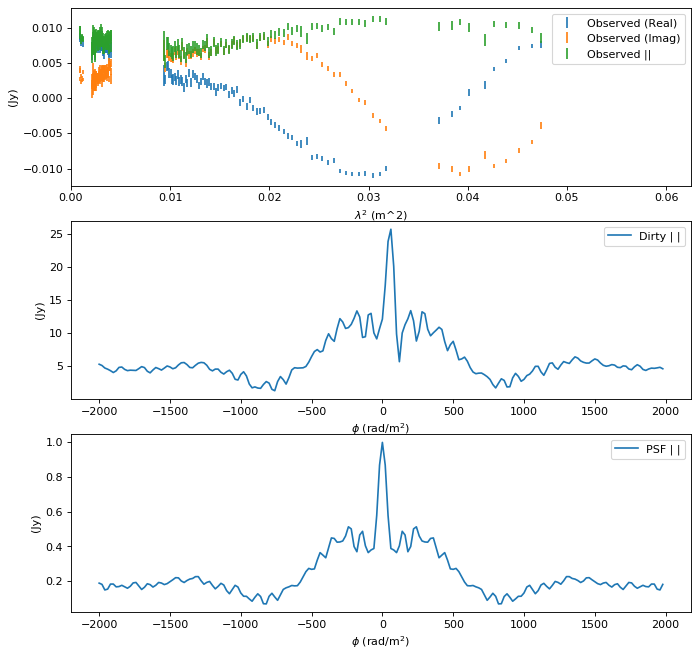

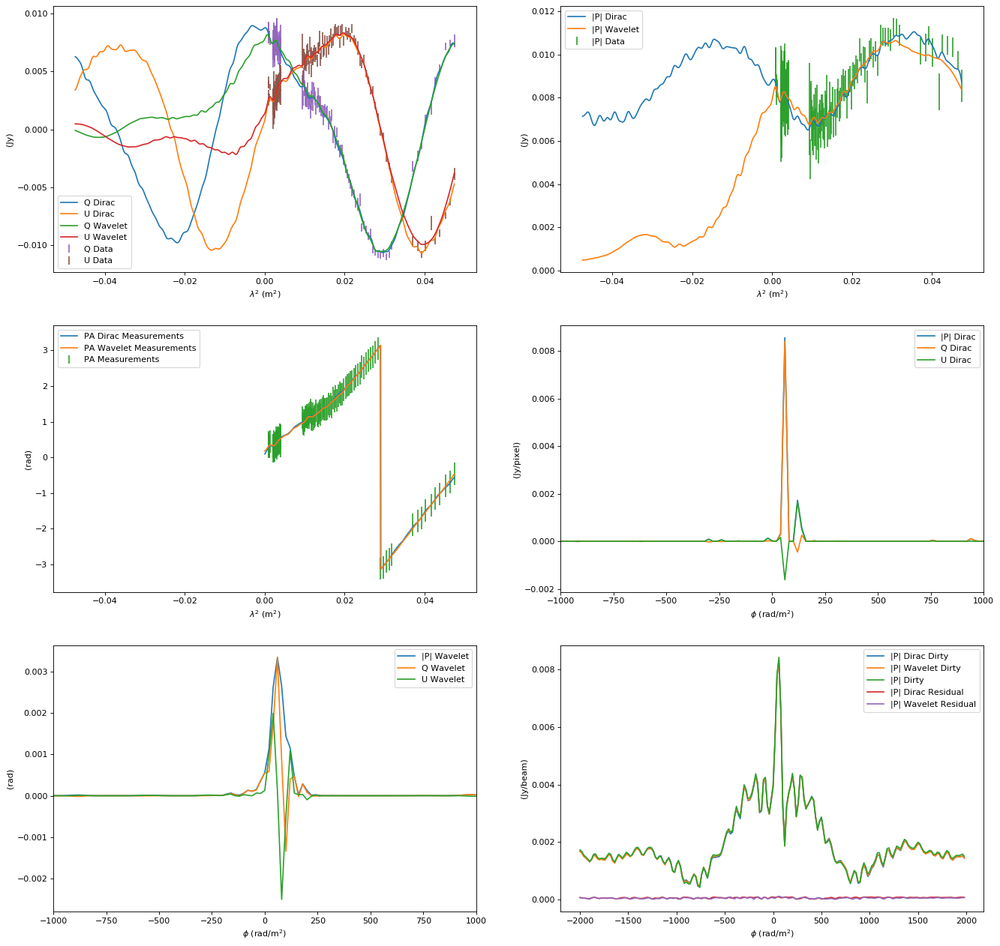

In [40]:
source = sources[34]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'lmc_s14'
92
2020-08-09 15:10:50,964 - Faraday Dreams - INFO - φ resolution 21.463768756438824 rad/m^2.
2020-08-09 15:10:50,965 - Faraday Dreams - INFO - φ max range is 77151.39198990288 rad/m^2.
2020-08-09 15:10:50,966 - Faraday Dreams - INFO - φ min range is 725.8290871785133 rad/m^2.
2020-08-09 15:10:50,981 - Optimus Primal - INFO - Starting Power method
2020-08-09 15:10:50,982 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2020-08-09 15:10:50,983 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2020-08-09 15:10:50,984 - Optimus Primal - INFO - [Power Method] Converged with iter = 14, tol = 6.525905824255795e-05
2020-08-09 15:10:50,985 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2020-08-09 15:10:50,985 - Faraday Dreams - INFO - Using an estimated noise level of 0.00010616779327392578 (weighted image units, i.e. Jy/Beam)
2020-08-09 15:10:50,986 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2

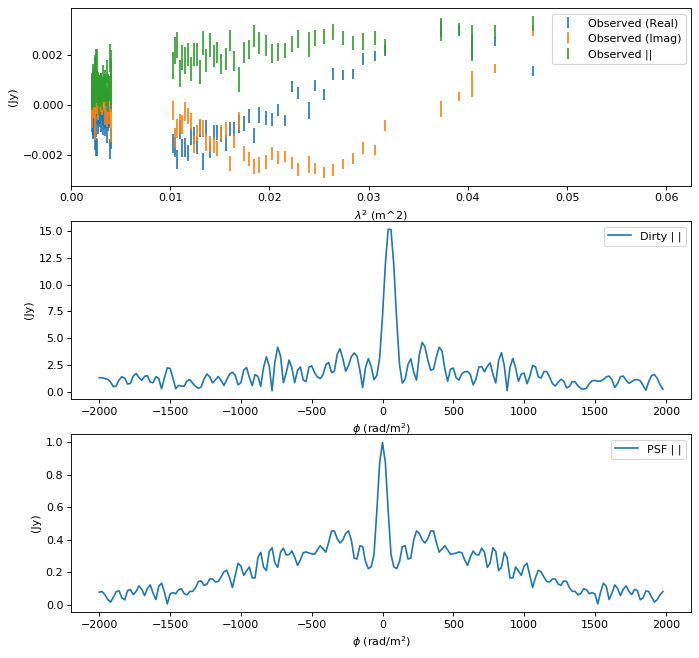

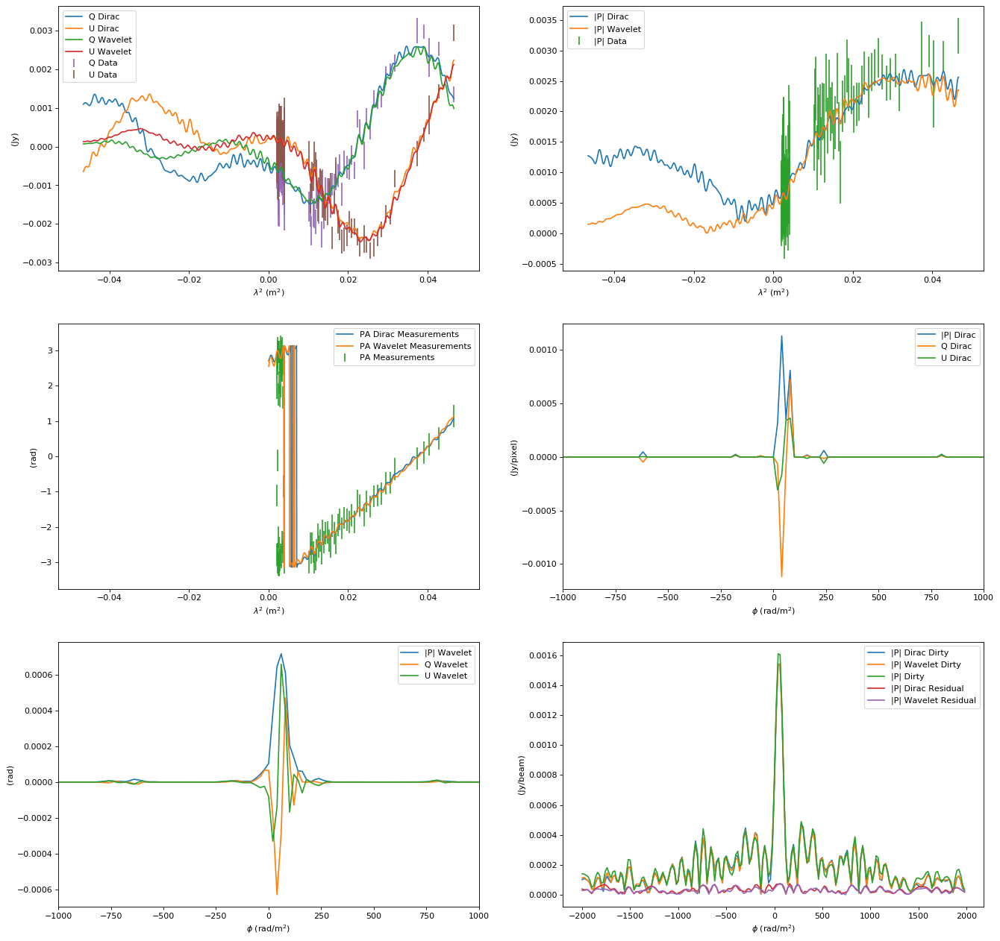

In [41]:
source = sources[35]
print(source)
wav = ['db4', "db6", "db8"]
levels = 1
sig_factor = 0.8
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)